In [3]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
flatui = ["#5684A0", "#3498db","#9b59b6","#2ecc71" ,"#C93551", "#7EC581", "#D69CC2", "#BEC45F","#FCC38E", "#ED8A4C", "#997474","#8B878D"]
sns.set_palette(flatui) 
sns.set(font_scale = 1.5)
import sys, os



import statsmodels.api as sm
from statsmodels.tsa.arima_model import ARIMA, ARIMAResults
from statsmodels.tsa.arima_process import ArmaProcess
from statsmodels.stats.diagnostic import acorr_ljungbox



from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error


# This one is only available in the development verison of statsmodels
# Run:
#    pip install git+https://github.com/statsmodels/statsmodels.git
# to install the development version.
from statsmodels.tsa.statespace.sarimax import SARIMAX


# grid search sarima hyperparameters
from math import sqrt
from multiprocessing import cpu_count
from joblib import Parallel
from joblib import delayed
from warnings import catch_warnings
from warnings import filterwarnings
from statsmodels.tsa.statespace.sarimax import SARIMAX


from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve, auc, roc_auc_score, precision_score

from sklearn.linear_model import LinearRegression


from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.ensemble import AdaBoostRegressor

from sklearn.tree import DecisionTreeRegressor


from scipy import signal
from scipy import stats

sys.path.append("..")
from eda_utilities import print_eda_stats
from data_pipeline import dockless_data_pipeline
from data_pipeline import weather_data_pipeline
from data_pipeline import find_top_group_by_column_list
from data_pipeline import prepare_cell_data
from data_pipeline import remove_invalid_trips

In [4]:
def evaluate(model, test_features, test_labels):
    predictions = model.predict(test_features)
    score = model.score(test_features, test_labels)
    print('Model Performance')
    print("Mean Square Error:", mean_squared_error(test_labels, predictions))
    print("Mean Absoulute Error:", mean_absolute_error(test_labels, predictions))
    print("Score:", score)
    return score

In [5]:
dockless_data = pd.read_csv("https://s3.amazonaws.com/sameera-bucket-1/dockless_mobility/raw_data/Austin_Dockless_Vehicle_Trips.csv")
dockless_vehicles_columns = dockless_data.columns
print_eda_stats(dockless_data, dockless_vehicles_columns, "Austin Dockless Mobility Data")
# Call the dockless_data_pipeline()
dockless_data = dockless_data_pipeline(dockless_data)
dockless_vehicles_columns = dockless_data.columns
print_eda_stats(dockless_data, dockless_vehicles_columns, "Austin Dockless Mobility Data")
dockless_data = remove_invalid_trips(dockless_data)

/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning: Columns (13) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


+--------------------------+---------+-------------+---------------+--------------+-------------------+
|       Column Name        |  dtype  | Total_Count | Unique_Values | df_totalrows | Null Value counts |
+--------------------------+---------+-------------+---------------+--------------+-------------------+
|            ID            |  object |   2746505   |    2746505    |   2746505    |         0         |
|        Device ID         |  object |   2746505   |     26999     |   2746505    |         0         |
|       Vehicle Type       |  object |   2746504   |       3       |   2746505    |         1         |
|      Trip Duration       | float64 |   2746504   |     10521     |   2746505    |         1         |
|      Trip Distance       | float64 |   2746504   |     16125     |   2746505    |         1         |
|        Start Time        |  object |   2746504   |     25694     |   2746505    |         1         |
|         End Time         |  object |   2746504   |     25768  

In [6]:
#Read the weather data from S3 bucket
weather_data = pd.read_csv("https://s3.amazonaws.com/sameera-bucket-1/dockless_mobility/raw_data/Austin_Bergstom_Airport_Weather.csv")
weather_columns = weather_data.columns
print_eda_stats(weather_data, weather_columns, "Austin Weather Data")
weather_data = weather_data_pipeline(weather_data)
weather_columns = weather_data.columns
print_eda_stats(weather_data, weather_columns, "Austin Weather Data")


+-----------------+---------+-------------+---------------+--------------+-------------------+
|   Column Name   |  dtype  | Total_Count | Unique_Values | df_totalrows | Null Value counts |
+-----------------+---------+-------------+---------------+--------------+-------------------+
|     STATION     |  object |     436     |       1       |     436      |         0         |
|       NAME      |  object |     436     |       1       |     436      |         0         |
|     LATITUDE    | float64 |     436     |       1       |     436      |         0         |
|    LONGITUDE    | float64 |     436     |       1       |     436      |         0         |
|    ELEVATION    | float64 |     436     |       1       |     436      |         0         |
|       DATE      |  object |     436     |      436      |     436      |         0         |
|       AWND      | float64 |     435     |       73      |     436      |         1         |
| AWND_ATTRIBUTES |  object |     435     |       

In [7]:
# Retrieve the top 10 origin cell IDs
top_10_origin_cell = find_top_group_by_column_list(dockless_data, 'Origin Cell ID', 'Trip Duration', 'count', n=10)

In [6]:
top_10_origin_cell

['014706',
 '014707',
 '014864',
 '014705',
 '015186',
 '015019',
 '014865',
 '014391',
 '014863',
 '015029']

##### Origin_Cell_ID Information
        014391	ACL Moody Theatre
        014705	Brazos St and Cesear Chavez
        014706	Elephant Room
        014707	6th and Congress
        014863	Austin Convention Center
        014864	6th and Trinity
        014865	Omni Austin Hotel (8th and San Jacinto)
        015019	Rainey Street(South of Cesear Chavez)
        015029	UT (Gregory Gymnasium)
        015186	UT(Moore-Hill Dormitory)

##### Run the model for Cell ID 014391

In [52]:
data_cell_data_hour = prepare_cell_data(dockless_data, weather_data, "014391")

In [28]:
# Create the test train split the same way as the univariate time series so this is the same as ARIMA series
size = int(len(data_cell_data_hour) * 0.66)
train, test = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]

y_train = train.pop('Trip Counts').values
X_train = train.values
y_test = test.pop('Trip Counts').values
X_test = test.values

best_rf = RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=90,
           max_features=7, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=3,
           min_samples_split=12, min_weight_fraction_leaf=0.0,
           n_estimators=100, n_jobs=1, oob_score=False, random_state=0,
           verbose=0, warm_start=False)

# best_rf = RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=110,
#            max_features=3, max_leaf_nodes=None, min_impurity_decrease=0.0,
#            min_impurity_split=None, min_samples_leaf=5,
#            min_samples_split=10, min_weight_fraction_leaf=0.0,
#            n_estimators=100, n_jobs=1, oob_score=False, random_state=None,
#            verbose=0, warm_start=False)


best_rf.fit(X_train, y_train)
best_random_forest_accuracy = evaluate(best_rf, X_test, y_test)

best_rf_predictions = best_rf.predict(X_test)

Model Performance
Mean Square Error: 46.805555758988014
Mean Absoulute Error: 4.179980026631158
Score: 0.5033522533815791


In [29]:
feature_imp = zip(train.columns.tolist(), best_rf.feature_importances_)

feature_imp_sort = sorted(feature_imp, reverse=True, key=lambda x: x[1])
for i,j in  feature_imp_sort:
    print(i, ":", j)

HOUR : 0.5031370887555113
HOUR_LABEL : 0.2795307071840954
WEEK : 0.03766615297419516
PRECIPITATION : 0.02972176626789569
DAY_OF_WEEK : 0.024242658191250467
AVG_DAILY_WIND_SPEED : 0.022687020286395104
DAY : 0.021504908954552863
MAX_TEMPERATURE : 0.021188402428567253
AVG_TEMPERATURE : 0.021028900170020248
MIN_TEMPERATURE : 0.018109170261023325
MONTH : 0.011810041110526089
WEEKEND : 0.005274715944468166
WEEKDAY : 0.004098467471498752
YEAR : 0.0
SNOW : 0.0


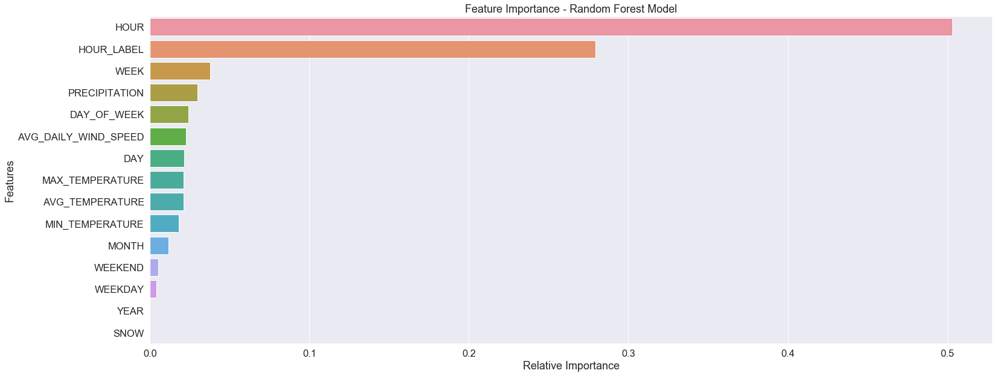

In [30]:
features, importances =  [list(t) for t in zip(*feature_imp_sort)]

plt.figure(figsize=(25,10))
sns.barplot(x=importances, y=features, data=test_results)
plt.title('Feature Importance - Random Forest Model')
plt.ylabel('Features')
plt.xlabel('Relative Importance')
plt.savefig('../../output/Final/Feature_Importance.png')


In [31]:
size = int(len(data_cell_data_hour) * 0.66)
train_1, test_1 = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]
test_results = test_1.drop(['MONTH', 'YEAR', 'HOUR', 'DAY', 'WEEK', 'DAY_OF_WEEK',
       'WEEKEND', 'WEEKDAY',
       'AVG_DAILY_WIND_SPEED', 'PRECIPITATION', 'SNOW', 'AVG_TEMPERATURE', 'HOUR_LABEL',
       'MAX_TEMPERATURE', 'MIN_TEMPERATURE'], axis=1)
test_results.rename(columns=dict(zip(["Trip Counts"], ["Actual"])), inplace=True)
rf_list = best_rf_predictions.tolist()
test_results['rf_predictions'] = rf_list

In [32]:
test_results.index.max()

Timestamp('2019-01-14 23:00:00')

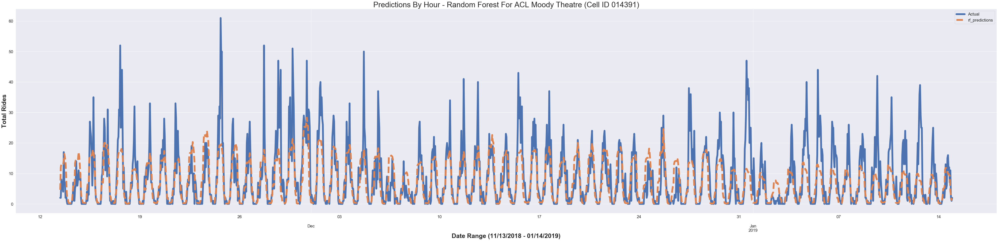

In [34]:
test_results.plot(style=['-', '--', ':'],figsize=(70, 15),linewidth=7.0)
plt.title('Predictions By Hour - Random Forest For ACL Moody Theatre (Cell ID 014391)', fontsize=30)
plt.ylabel('Total Rides', fontsize=25,fontweight='bold')
plt.xlabel('Date Range (11/13/2018 - 01/14/2019)', fontsize=25,fontweight='bold')
plt.savefig('../../output/Final/Random_Forest_Predictions_Moody_Theatre_014391.png')

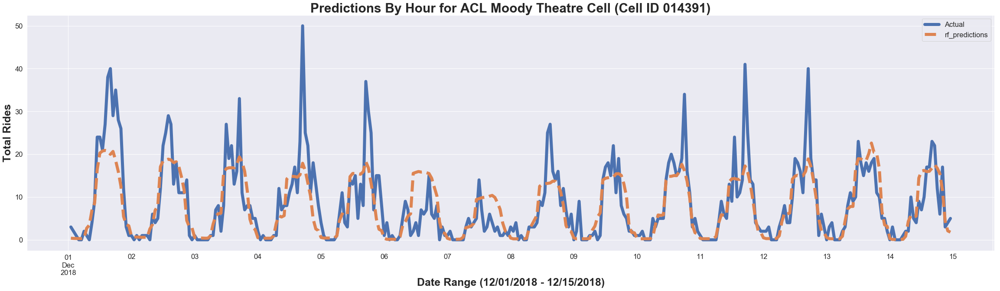

In [35]:

dec_1_dec_15 = test_results[(test_results.index > '2018-12-01') & (test_results.index < '2018-12-15')]

dec_1_dec_15.plot(style=['-', '--', ':'],figsize=(40, 10),linewidth=7.0)

plt.title('Predictions By Hour for ACL Moody Theatre Cell (Cell ID 014391)', fontweight='bold',fontsize=30)
plt.ylabel('Total Rides',fontsize=25,fontweight='bold')
plt.xlabel('Date Range (12/01/2018 - 12/15/2018)', fontsize=25,fontweight='bold')
plt.savefig('../../output/Final/Random_Forest_Predictions_Moody_Theatre_014391_Dec01_Dec15.png')


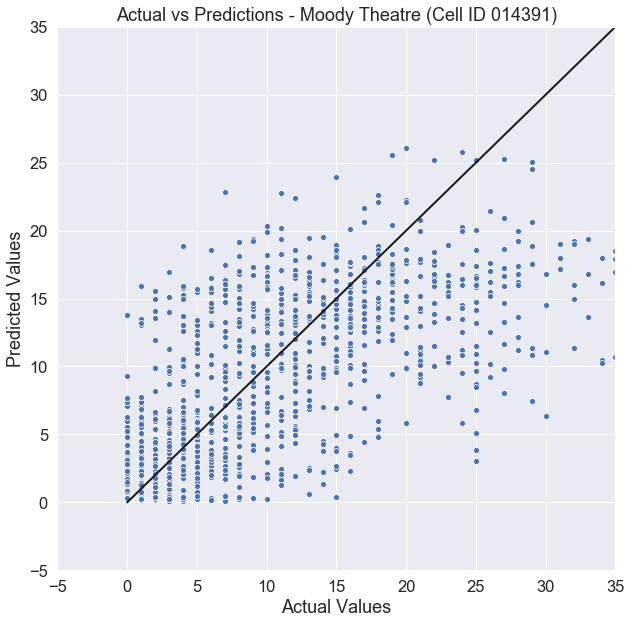

In [36]:

plt.figure(figsize=(10,10))
sns.scatterplot(x="Actual", y="rf_predictions", data=test_results)
plt.ylim(-5,35)
plt.xlim(-5,35)
plt.plot([test_results['Actual'].min(), (test_results['Actual'].max())-2], 
          [test_results['Actual'].min(),(test_results['Actual'].max()) -2], 'k', lw=2)
plt.title('Actual vs Predictions - Moody Theatre (Cell ID 014391)')
plt.ylabel('Predicted Values')
plt.xlabel('Actual Values')
plt.savefig('../../output/Final/Actual_Prediction_Summary_Moody_Theatre_014391.png')

##### Investigating why the peaks are happening in the actual values. Most of them are related to evening commute and some night hours

In [37]:
### Analyzing results for Moody_Theatre_014391 cell

t = test_results
t['DAY_OF_WEEK'] = pd.DatetimeIndex(t.index).weekday
t['WEEKEND'] = ((pd.DatetimeIndex(t.index).weekday) // 5 == 1).astype(float)
t['WEEKDAY'] = ((pd.DatetimeIndex(t.index).weekday) // 5 == 0).astype(float)
t['HOUR'] = pd.DatetimeIndex(t.index).hour
hours=[0, 6, 10, 15, 19, 23]
t['HOUR_LABEL'] = pd.cut(t['HOUR'], hours, include_lowest=True, right=True, labels=['0', '1', '2', '3', '4'])
#t_12 = t[(t['DAY_OF_WEEK'] == 5) & ((t['HOUR_LABEL'] == '3') | (t['HOUR_LABEL'] == '4'))]
hour_label_3_4 = t[((t['HOUR_LABEL'] == '3') | (t['HOUR_LABEL'] == '4'))]
hour_label_3_4

,Actual,rf_predictions,DAY_OF_WEEK,WEEKEND,WEEKDAY,HOUR,HOUR_LABEL
Start Time,,,,,,,
2018-11-13 16:00:00,17,14.295,1,0.0,1.0,16,3
2018-11-13 17:00:00,7,16.380,1,0.0,1.0,17,3
2018-11-13 18:00:00,7,15.270,1,0.0,1.0,18,3
2018-11-13 19:00:00,2,13.545,1,0.0,1.0,19,3
2018-11-13 20:00:00,3,9.540,1,0.0,1.0,20,4
2018-11-13 21:00:00,1,3.815,1,0.0,1.0,21,4
2018-11-13 22:00:00,0,1.760,1,0.0,1.0,22,4
2018-11-13 23:00:00,0,1.415,1,0.0,1.0,23,4
2018-11-14 16:00:00,8,14.775,2,0.0,1.0,16,3


#### Grid Search for the moody theatre cell  even though the random forest parameters are from the most popular cell - 014706

In [17]:
from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3, 5, 7, 10, 13, 14],
    'min_samples_leaf': [3, 4, 5],
    'criterion':['mae', 'mse'],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = RandomForestRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)


# Fit the grid search to the data
grid_search.fit(X_train, y_train)
#print("Grid Search Best Parameters:" grid_search.best_params_)

best_grid = grid_search.best_estimator_
grid_accuracy = evaluate(best_grid, X_test, y_test)


Fitting 3 folds for each of 2016 candidates, totalling 6048 fits
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV] bootstrap=True, criterion=mae, max_depth=80, max_featur

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:   45.2s


[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=  40.0s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   7.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  11.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  12.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_f

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=  41.5s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   3.8s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   3.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=  39.5s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_feat

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  10.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  10.3s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  10.3s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   3.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_fea

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   4.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   4.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   9.3s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   9.2s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_feat

[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  4.8min


[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  14.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  14.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  13.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   4.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_feature

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=  46.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=  45.9s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   9.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   9.3s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_feature

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  15.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   8.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=  48.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   8.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  14.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 1.2min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  13.8s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  21.8s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_fe

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.2min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   7.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.2min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   6.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_feat

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  13.4s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  20.8s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  21.0s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  20.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_fe

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 1.2min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   8.8s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   9.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  20.5s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_fea

[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 16.0min


[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 1.6min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  19.4s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  28.2s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  27.8s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_f

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.5min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.5min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   9.2s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.5min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_feat

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  26.9s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  26.4s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  25.9s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   8.4s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_fea

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  12.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 1.4min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  24.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  25.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, m

[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  34.3s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  11.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  12.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10,

[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  22.4s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 2.0min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  22.9s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  23.1s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_f

[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 1.8min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  14.4s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  14.9s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=10, min

[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  30.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  44.4s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features

[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 2.4min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  14.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  14.9s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13

[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  42.9s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  44.7s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  44.8s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=

[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed: 44.2min


[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.4min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  17.8s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=80, m

[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  47.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  49.0s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  48.4s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=

[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  18.6s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 3.2min
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=  37.2s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=1

[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  48.4s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=  16.0s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=  16.2s
[CV] bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14,

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   7.0s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  11.0s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  10.8s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   3.4s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   3.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   6.9s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=80, max_features=14, min_samples_

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   6.8s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=  11.1s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=  10.6s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=  37.4s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   4.4s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=  36.6s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=2, min_sa

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  14.2s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   5.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  14.4s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_s

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   9.8s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=  47.0s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   9.2s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   4.4s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   4.3s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=  44.0s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=3, min_s

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  13.4s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  12.9s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  19.8s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_sample

[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed: 70.8min


[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 1.1min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  12.8s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  19.0s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  19.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_f

[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=71.3min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=71.3min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   5.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=71.2min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_feat

[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  19.3s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  18.8s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  18.8s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   7.3s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_fea

[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   8.7s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   8.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  16.4s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  16.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_feat

[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  25.7s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   8.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   8.7s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   8.7s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_featu

[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  16.6s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  16.3s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  16.9s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  25.1s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=

[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  12.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 1.5min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  12.7s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  12.1s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_fea

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  23.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  34.7s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  36.2s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 2.1min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  12.1s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 2.1min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  35.6s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  35.4s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  13.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=1

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 1.9min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  29.7s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  30.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  14.7s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  15.2s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  15.0s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13

[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  30.2s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  29.9s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  44.1s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  17.6s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, m

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  33.8s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  49.3s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  50.0s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=

[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed: 315.8min


[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  32.8s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  54.0s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  55.5s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  56.6s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_f

[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 2.7min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  15.1s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 2.7min
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, m

[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  46.6s
[CV] bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  47.8s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  47.6s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   3.3s
[CV] bootstrap=True, criterion=mae, max_depth=100, ma

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   7.2s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   6.9s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  10.4s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2

[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  10.4s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  10.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   3.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   3.3s
[CV] bootstrap=True, criterion=mae, max_depth=100, 

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   8.0s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=  35.8s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   7.7s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=  38.9s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   5.7s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  15.9s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=2

[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  11.0s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  10.4s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  10.3s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  15.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_f

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   4.8s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=  48.3s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   4.7s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   9.2s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  14.9s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  15.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 1.3min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 1.3min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  15.6s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  20.6s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  20.0s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   6.7s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 1.1min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  13.5s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  13.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 1.2min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  27.9s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   9.7s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=5

[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  18.3s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  18.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  18.0s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  27.6s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_f

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   8.6s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 1.5min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   8.8s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=  18.4s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  25.9s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  25.8s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_feature

[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  12.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 2.0min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 2.0min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  23.5s
[CV] bootstrap=True, criterion=mae, max_dept

[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed: 350.1min


[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  24.6s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 2.0min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  36.5s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  36.8s
[CV] bootstrap=True, criterion=mae, max_d

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  11.5s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 2.0min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  11.7s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_fea

[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  24.6s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  35.5s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  35.5s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  35.5s
[CV] bootstrap=True, criterion=mae, max_de

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  16.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  16.9s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 2.0min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_fe

[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  45.6s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  46.8s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  46.6s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  14.5s
[CV] bootstrap=True, criterion=mae, max_depth=1

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 2.6min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  29.2s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 2.6min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_featur

[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  46.4s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  45.7s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  16.0s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  16.3s
[CV] bootstrap=True, criterion=mae, max_depth=100

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  31.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 2.6min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  32.0s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_fe

[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  46.3s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  15.0s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  15.4s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 2.6min
[CV] bootstrap=True, criterion=mae, max_dept

[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  30.1s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  30.0s
[CV] bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_

[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   3.1s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   3.3s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   6.8s
[CV] bootstrap=True, criterion=mae, max_depth=110

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   9.6s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  10.3s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2,

[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   3.3s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   3.2s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=  32.4s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=  33.6s
[CV] bootstrap=True, criterion=mae, max_depth=110, max

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   6.5s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   9.9s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   9.7s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=  43.9s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=  45.1s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   9.0s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  12.7s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  12.7s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   4.4s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=  43.0s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   9.1s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   9.0s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=  43.8s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=  41.6s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  19.3s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=

[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  12.7s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  12.6s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  12.6s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  19.7s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_f

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   6.3s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   6.1s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 1.1min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min

[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed: 397.8min


[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 1.1min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 1.0min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   6.3s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 1.0min
[CV] bootstrap=True, criterion=mae, max_depth=110, 

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  25.2s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  25.4s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   8.5s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 1.4min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=  16.8s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 1.4min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  25.0s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   8.0s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 1.4min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7

[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 1.4min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  22.9s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  23.2s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  23.4s
[CV] bootstrap=True, criterion=mae, max_depth=110

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=  11.0s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=  11.2s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total= 1.9min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features

[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  21.8s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  22.5s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  22.5s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=  33.3s
[CV] bootstrap=True, criterion=mae, max_de

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 1.8min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  11.1s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 1.8min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_fea

[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  29.1s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  29.0s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  43.0s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  44.0s
[CV] bootstrap=True, criterion=mae, max_d

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  14.2s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 2.4min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 2.4min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_f

[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  28.0s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  40.9s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  42.2s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  42.2s
[CV] bootstrap=True, criterion=mae, max_depth=11

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 2.3min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  15.6s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 2.3min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_featur

[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  45.8s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  46.5s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  46.1s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=  14.8s
[CV] bootstrap=True, criterion=mae, max_depth=

[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  14.9s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 2.5min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  29.7s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_fea

[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  45.6s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  45.3s
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.4min
[CV] bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mae, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  14.9s
[CV] bootstrap=True, criterion=mae, max_dept

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_fea

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.3s
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_sam

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   2.7s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_featur

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   2.8s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   3.1s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_feat

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_feat

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   0.9s
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.3s
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=80, max_feat

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   3.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   3.7s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_fe

[Parallel(n_jobs=-1)]: Done 3265 tasks      | elapsed: 443.2min


[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   3.7s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   3.8s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   3.8s
[CV] bootstrap=True, criterion=mse, max_depth=80, ma

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_feat

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   3.7s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_fea

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.9s
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_feat

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   4.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_fea

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.5s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.5s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   4.4s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   4.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_fe

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.5s
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   5.4s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   5.2s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.5s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.5s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=1

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=1

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   6.1s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=1

[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   6.2s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   6.1s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   6.0s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, m

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   6.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   6.3s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14

[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.9s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=80, max_features=1

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   2.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_s

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   2.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   2.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_sample

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   3.0s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   3.0s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=2, min_sampl

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_sa

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   3.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_sa

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.3s
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_feat

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_

[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed: 446.5min


[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   3.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   3.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_feature

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   3.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_feature

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   4.5s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_fea

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   4.5s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   4.5s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_feat

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_f

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   4.2s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.5s
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV] bootstrap=True, criterion=mse, max_depth=90, m

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.6s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.6s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.6s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, m

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.5s
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   5.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   5.1s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.5s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.5s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, m

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   6.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=1

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   6.4s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   6.0s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   5.7s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   2.0s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   2.0s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_f

[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   6.5s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   6.2s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, m

[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.9s
[CV] bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.9s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, ma

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   6.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   2.9s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_feature

[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.3s
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   2.9s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=

[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   3.3s
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, m

[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=100,

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   4.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   4.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   3.8s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   3.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   3.7s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features

[Parallel(n_jobs=-1)]: Done 4885 tasks      | elapsed: 449.9min


[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   4.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=10

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   4.8s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   4.7s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features

[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   4.2s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_dept

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_featu

[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   5.1s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=100

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.5s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=

[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   6.2s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_dep

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   6.4s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_fea

[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_de

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   6.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   6.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_f

[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   1.4s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   2.0s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   2.0s
[CV] bootstrap=True, criterion=mse, max_depth=10

[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   6.5s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   6.5s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_featur

[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_dept

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   6.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   2.9s
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=110,

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=   1.0s
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   2.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3

[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_f

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   3.2s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, m

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   4.0s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   4.0s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=   0.8s
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5

[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.2s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.1s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=110,

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   3.7s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.8s
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=110,

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   3.6s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=   3.7s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=

[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=   4.4s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.4s
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   0.4s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=   4.5s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=   0.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_feature

[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.5s
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   5.7s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=   5.7s
[CV] bootstrap=True, criterion=mse, max_dept

[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   1.0s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.6s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.5s
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=   1.6s
[CV] bootstrap=True, criterion=mse, max_d

[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   5.2s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   5.2s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=   5.0s
[CV] bootstrap=True, criterion=mse, max_d

[Parallel(n_jobs=-1)]: Done 5816 tasks      | elapsed: 453.8min


[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.5s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   5.2s
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   5.2s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   5.0s
[CV] bootstrap=True, criterion=mse, max_dept

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_f

[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   6.6s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=   6.2s
[CV] bootstrap=True, criterion=mse, max_de

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=   1.8s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   0.6s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_featu

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=   5.8s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   1.4s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=   1.4s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=   1.9s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   0.7s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=

[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=   6.4s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.4s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   1.3s
[CV] bootstrap=True, criterion=mse, max_dep

[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   0.8s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=   7.2s
[CV] bootstrap=True, criterion=mse, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  bootstrap=True, criterion=mse, max_depth=110, max_fea

[Parallel(n_jobs=-1)]: Done 6048 out of 6048 | elapsed: 455.1min finished


Model Performance
Mean Square Error: 52.25642576564581
Mean Absoulute Error: 4.345446071904128
Score: 0.44551377113267043


In [ ]:
best_grid

In [69]:
# GradientBoostingRegressor GridSearch

from sklearn.model_selection import GridSearchCV
# Create the parameter grid based on the results of random search 
param_grid = {
    'learning_rate': [1, 0.5, 0.25, 0.1, 0.05, 0.01],
    'max_depth': [80, 90, 100, 110],
    'max_features': [2, 3, 5, 7, 10, 13, 14],
    'min_samples_leaf': [3, 4, 5],
    'criterion':['mae', 'mse'],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 200, 300, 1000]
}
# Create a based model
rf = GradientBoostingRegressor()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)


# Fit the grid search to the data
grid_search.fit(X_train, y_train)
#print("Grid Search Best Parameters:" grid_search.best_params_)

best_grid = grid_search.best_estimator_
grid_accuracy = evaluate(best_grid, X_test, y_test)


Fitting 3 folds for each of 12096 candidates, totalling 36288 fits
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV] criterion=mae, learning_rate=1, max_depth=80, 

[Parallel(n_jobs=-1)]: Done  25 tasks      | elapsed:  1.1min


[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  13.2s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  12.5s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  16.9s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=  35.5s
[CV] criterion=mae, learning_rate=1, max_depth=

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  15.9s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   9.1s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   8.9s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  13.4s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=  31.1s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  14.6s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  24.5s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  14.5s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  18.0s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3,

[Parallel(n_jobs=-1)]: Done 146 tasks      | elapsed:  6.1min


[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  18.9s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=  50.5s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  23.0s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  21.0s
[CV] criterion=mae, learning_rate=1, max_depth=80, ma

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  11.7s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  11.6s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  11.1s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_s

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  23.0s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  23.9s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total=  52.1s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=3,

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  16.5s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  27.7s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  28.5s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  15.3s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  22.7s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  21.1s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 1.8min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_featur

[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  50.9s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  41.1s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  27.5s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  26.8s
[CV] criterion=mae, learning_rate=1, max_depth=80, ma

[Parallel(n_jobs=-1)]: Done 349 tasks      | elapsed: 21.7min


[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  39.3s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 2.8min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total= 1.9min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  40.0s
[CV] criterion=mae, learning_rate=1, max_depth=

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  26.7s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.8min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  24.9s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  32.2s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 1.5min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  35.1s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features

[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  38.8s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  47.7s
[CV] criterion=mae, learning_rate=1, max_depth

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 2.6min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  38.1s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_fea

[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  34.4s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 3.7min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  38.7s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  51.8s
[CV] criterion=mae, learning_rate=1, max_depth=80

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 2.3min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_featur

[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  56.6s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  52.5s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 5.2min
[CV] criterion=mae, learning_rate=1, max_de

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 1.6min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 1.8min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  42.9s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_fea

[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=10.8min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total= 1.1min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total= 1.1min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.8min
[CV] criterion=mae, learning_rate=1, max_d

[Parallel(n_jobs=-1)]: Done 632 tasks      | elapsed: 69.9min


[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  39.1s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  46.7s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  46.2s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 3.1min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total= 1.6min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total= 1.6min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_f

[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  55.8s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  58.6s
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total= 1.1min
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 4.3min
[CV] criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_feat

[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  13.9s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  13.0s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  16.9s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_f

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=  44.2s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  15.6s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  14.6s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, m

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  11.1s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=   9.9s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  11.0s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  13.2s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   7.3s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   7.3s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=2

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  18.4s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  21.3s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=  43.2s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_feature

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  11.3s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=  49.4s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  10.2s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  18.6s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=  45.6s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=  45.1s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=

[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  19.7s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  19.4s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  27.5s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=  42.6s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_f

[Parallel(n_jobs=-1)]: Done 997 tasks      | elapsed: 111.8min


[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  27.9s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  24.8s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  31.3s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total= 1.1min
[CV] criterion=mae, learning_rate=1, max_depth=

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  15.6s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  19.6s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 1.0min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 1.0min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  30.5s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  55.3s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  27.7s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  35.8s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7,

[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  38.8s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  44.8s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  44.8s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 1.9min
[CV] criterion=mae, learning_rate=1, max_depth=90, ma

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  23.4s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  32.8s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  38.2s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_

[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  44.5s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  44.4s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  48.6s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  38.2s
[CV] criterion=mae, learning_rate=1, max_depth=90, 

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  37.3s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  43.7s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  42.4s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_f

[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  33.7s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  31.4s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 7.9min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  45.6s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.1min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_

[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  44.5s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 3.4min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  45.5s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 3.8min
[CV] criterion=mae, learning_rate=1, max_d

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.7min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 3.4min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 3.5min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_fe

[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  41.8s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  44.2s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 8.1min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=90,

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.7min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 3.4min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_fe

[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total= 1.9min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  49.0s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  49.1s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total= 1.1min
[CV] criterion=mae, learning_rate=1, max_dep

[Parallel(n_jobs=-1)]: Done 1442 tasks      | elapsed: 183.6min


[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 2.9min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.7min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth

[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  47.9s
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 5.6min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features

[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.6min
[CV] criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=   9.5s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=90, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 3.2min
[CV] criterion=mae, learning_rate=1, max_dept

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  11.4s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=  34.3s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=  29.8s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=  44.2s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  15.4s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  16.2s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=   8.7s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=   8.4s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  10.4s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  10.6s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_f

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  22.2s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  18.1s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total=  44.3s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  23.8s
[CV] criterion=mae, learning_rate=1, max_depth

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  15.0s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  16.0s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  15.8s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_feature

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=  39.2s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=  43.6s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  10.7s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  11.4s
[CV] criterion=mae, learning_rate=1, max_depth=

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=  13.8s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=  16.6s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  16.3s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  18.9s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  18.3s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  35.7s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=  25.9s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  26.6s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  29.4s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=  17.0s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=  17.5s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  44.1s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  49.9s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_fea

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=  27.2s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=  24.0s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total= 2.1min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  31.1s
[CV] criterion=mae, learning_rate=1, max_depth=10

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 1.6min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=  43.6s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 1.6min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_fe

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  24.7s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  24.5s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=  41.0s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=  36.8s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 2.4min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  32.6s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100,

[Parallel(n_jobs=-1)]: Done 1969 tasks      | elapsed: 233.6min


[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  48.3s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  56.0s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total= 2.4min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  32.1s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  37.5s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 2.8min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100,

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.0min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  53.2s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  44.5s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.2min
[CV] criterion=mae, learning_rate=1

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  44.4s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 3.7min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  48.9s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 2.6min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.6min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  40.1s
[CV] criterion=mae, learning_rate=1, m

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  45.9s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  54.3s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  54.5s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_fe

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 2.7min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=1, ma

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total= 1.0min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total= 3.2min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=10

[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  47.4s
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 4.5min
[CV] criterion=mae, learning_rate=1, 

[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total= 1.0min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 3.1min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 5.7min
[CV] criterion=mae, learning_rate=1, max_depth=100, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=1

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   9.5s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   9.0s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=   9.2s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=  34.6s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=  29.7s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  12.1s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=  35.7s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_fe

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   7.5s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   8.1s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=   8.1s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total=  35.5s
[CV] criterion=mae, learning_rate=1, max_depth=11

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=  12.4s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  13.7s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  16.8s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=  52.6s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total=  54.6s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  11.9s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  11.7s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  17.5s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total=  23.9s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total=  43.5s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total=  41.2s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  18.9s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=  10.8s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  13.9s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  24.1s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  30.2s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  32.3s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_featu

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=  17.4s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=  19.9s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  25.4s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  26.1s
[CV] criterion=mae, learning_rate=1, max_depth=110,

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total=  29.5s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_feat

[Parallel(n_jobs=-1)]: Done 2576 tasks      | elapsed: 312.9min


[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  14.5s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  16.7s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  16.3s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total=  21.0s
[CV] criterion=mae, learning_rate=1, max_dep

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total=  40.9s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 1.5min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 2.1min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  24.3s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  23.1s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total=  27.1s
[CV] criterion=mae, learning_rate=1, max_de

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  42.7s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  37.9s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_fea

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  35.9s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  37.9s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 1.4min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 1.5min
[CV] criterion=mae, learning_rate=1, max_d

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total= 2.4min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  54.1s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, ma

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 3.3min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  46.6s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  43.4s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total= 1.1min
[CV] criterion=mae, learning_rate=1,

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.2min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  33.4s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.3min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110,

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total= 1.0min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total= 1.3min
[CV] criterion=mae, learning_rate=1

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  46.1s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  40.7s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  47.2s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110,

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  53.5s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total= 1.0min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 2.3min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=1, ma

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  49.7s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  49.9s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 4.8min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total= 1.0min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total= 1.3min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=1,

[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  52.7s
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total= 1.0min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 5.2min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=1, max_depth=110,

[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 2.6min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total= 1.2min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 3.7min
[CV] criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=1, max_depth=110, max_features=14, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  45.9s
[CV] criterion=mae, learning_rate=1,

[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  19.7s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  18.1s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  17.7s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  29.0s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total=  29.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   8.8s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=   7.5s
[CV] criterion=mae, learning_rate=0.5, 

[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 1.7min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  19.3s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  19.0s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, ma

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total=  30.3s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 1.6min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  15.1s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 1.6min
[CV] criterion=mae, learning_rate=0.5, 

[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  27.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  28.7s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 2.4min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  13.1s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 2.3min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 2.3min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  13.6s
[CV] criterion=mae, learning_rate=0.5

[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  28.4s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  26.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  40.3s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  22.4s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  21.6s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=3, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 2.3min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5

[Parallel(n_jobs=-1)]: Done 3265 tasks      | elapsed: 415.9min


[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 3.8min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  46.3s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total= 1.2min
[CV] criterion=mae, learning_rate=

[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  21.8s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 3.8min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  22.5s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total=  45.0s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0

[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  30.2s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 3.7min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  31.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=8

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total= 1.6min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  30.3s
[CV] criterion=mae, learning_rate=0.5, m

[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 5.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  57.8s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  57.2s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  40.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  46.3s
[CV] criterion=mae, learning_rate=0.5

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 8.0min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 8.0min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total= 1.5min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 7.9min
[CV] criterion=mae, learning_r

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 2.2min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 2.3min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  40.1s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  43.1s
[CV] criterion=mae, learning_r

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=  42.0s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 7.7min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total= 1.4min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total= 1.5min
[CV] criterion=mae, learning_

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total= 2.8min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 7.3min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 7.5min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  54.5s
[CV] criterion=mae, learning_

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=10.2min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.9min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total=10.9min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.9min
[CV] criterion=mae, learning_rate

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total= 2.9min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total= 3.0min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  55.3s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  51.9s
[CV] criterion=mae, learning_rate=0

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=10.3min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total= 1.7min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total= 1.8min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total=10.2min
[CV] criterion=mae, learning_r

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total= 3.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total= 3.4min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total= 1.0min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total= 1.1min
[CV] criterion=mae, learning_r

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=11.8min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total= 2.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total= 2.2min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total= 2.2min
[CV] criterion=mae, learning_

[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total= 3.2min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total= 3.2min
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=  56.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=80, max_features=14, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total= 1.1min
[CV] criterion=mae, learning_rat

[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  16.8s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total=  20.3s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  26.7s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=8, n_estimators=300, total=  27.8s
[CV] criterion=mae, learning_rate=0.5, max_d

[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total= 1.6min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total=  27.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=   8.7s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=8, n_estimators=100, total=  10.3s
[CV] criterion=mae, learning_rate=0.5, ma

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  16.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  17.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=200, total=  20.0s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=4, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=9

[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=10, n_estimators=300, total=  27.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=   8.7s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=100, total=  10.0s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=2, min_samples_leaf=5, min_samples_split=8, n_estimators=1000, total= 1.6min
[CV] criterion=mae, learning_rate=0.5

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  24.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  26.4s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=200, total=  27.3s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=

[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  13.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  13.2s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=100, total=  11.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total= 2.2min
[CV] criterion=mae, learning_rate=0.

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  27.5s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 2.3min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total=  40.2s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, 

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=3, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 2.2min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  20.7s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=100, total=  21.3s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max

[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 3.8min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  45.3s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=3, min_samples_split=12, n_estimators=300, total= 1.2min
[CV] criterion=mae, learning_rate=

[Parallel(n_jobs=-1)]: Done 4034 tasks      | elapsed: 641.1min


[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total=  44.4s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=8, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, ma

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 3.7min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=4, min_samples_split=10, n_estimators=1000, total= 3.8min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=200, total=  41.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, m

[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=12, n_estimators=300, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=5, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 3.7min
[CV] criterion=mae, learning_rate=0.5

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=8, n_estimators=1000, total= 5.5min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=200, total=  57.5s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=3, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90

[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=10, n_estimators=300, total= 1.5min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100, total=  28.9s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=8, n_estimators=1000, total= 5.4min
[CV] criterion=mae, learning_rate=0.5

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=4, min_samples_split=12, n_estimators=1000, total= 5.2min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total= 1.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=200, total= 1.0min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth=

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 5.0min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100, total=  39.1s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=7, min_samples_leaf=5, min_samples_split=12, n_estimators=1000, total= 5.4min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_d

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=3, min_samples_split=10, n_estimators=1000, total= 7.9min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.4min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=200, total= 1.4min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=4, min_samples_split=12, n_estimators=300, total= 2.2min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  41.0s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=100, total=  42.8s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=8, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_depth=9

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total= 1.6min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total= 1.6min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=200, total= 1.7min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=10, min_samples_leaf=5, min_samples_split=12, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  59.6s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=10, n_estimators=300, total= 3.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=100, total=  50.6s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_d

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=10.2min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=200, total= 1.8min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=3, min_samples_split=12, n_estimators=1000, total=10.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=4, min_samples_split=10, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, ma

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=8, n_estimators=300, total= 3.0min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=  49.1s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=100, total=  53.2s
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=200 
[CV]  criterion=mae, learning_rate=0.5, max_de

[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=13, min_samples_leaf=5, min_samples_split=10, n_estimators=1000, total= 9.9min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total= 2.0min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=300 
[CV]  criterion=mae, learning_rate=0.5, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=200, total= 2.1min
[CV] criterion=mae, learning_rate=0.5, max_depth=90, max_features=14, min_samples_leaf=3, min_samples_split=8, n_estimators=1000 
[CV]  criterion=mae, learning_rate=0.5, max_depth

KeyboardInterrupt: 

##### Analyzing 014706 - Elephant Room - Congress and 3rd

In [66]:
data_cell_data_hour = prepare_cell_data(dockless_data, weather_data, "014706")

In [67]:
# Create the test train split the same way as the univariate time series so this is the same as ARIMA series
size = int(len(data_cell_data_hour) * 0.66)
train, test = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]

y_train = train.pop('Trip Counts').values
X_train = train.values
y_test = test.pop('Trip Counts').values
X_test = test.values

best_rf = RandomForestRegressor(bootstrap=True, criterion='mae', max_depth=90,
           max_features=7, max_leaf_nodes=None, min_impurity_decrease=0.0,
           min_impurity_split=None, min_samples_leaf=3,
           min_samples_split=12, min_weight_fraction_leaf=0.0,
           n_estimators=100, n_jobs=1, oob_score=False, random_state=0,
           verbose=0, warm_start=False)

best_rf.fit(X_train, y_train)
best_random_forest_accuracy = evaluate(best_rf, X_test, y_test)

best_rf_predictions = best_rf.predict(X_test)

Model Performance
Mean Square Error: 46.805555758988014
Mean Absoulute Error: 4.179980026631158
Score: 0.5033522533815791


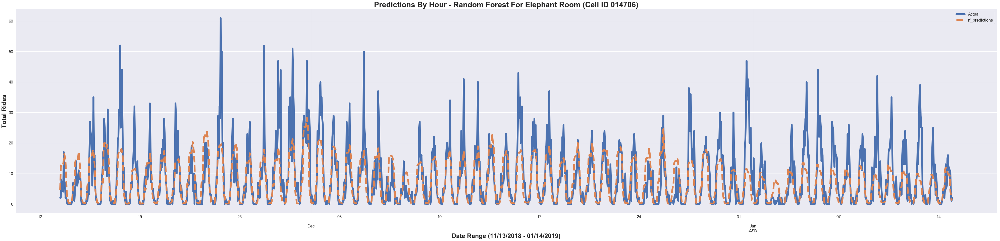

In [40]:
size = int(len(data_cell_data_hour) * 0.66)
train_1, test_1 = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]
test_results = test_1.drop(['MONTH', 'YEAR', 'HOUR', 'DAY', 'WEEK', 'DAY_OF_WEEK',
       'WEEKEND', 'WEEKDAY',
       'AVG_DAILY_WIND_SPEED', 'PRECIPITATION', 'SNOW', 'AVG_TEMPERATURE', 'HOUR_LABEL',
       'MAX_TEMPERATURE', 'MIN_TEMPERATURE'], axis=1)
test_results.rename(columns=dict(zip(["Trip Counts"], ["Actual"])), inplace=True)
rf_list = best_rf_predictions.tolist()
test_results['rf_predictions'] = rf_list
test_results.plot(style=['-', '--', ':'],figsize=(70, 15),linewidth=7.0)
plt.title('Predictions By Hour - Random Forest For Elephant Room (Cell ID 014706)', fontweight='bold', fontsize=30)
plt.ylabel('Total Rides', fontsize=25, fontweight='bold')
plt.xlabel('Date Range (11/13/2018 - 01/14/2019)', fontsize=25,fontweight='bold')
plt.savefig('../../output/Final/Random_Forest_Predictions_Elephant_Room_014706.png')


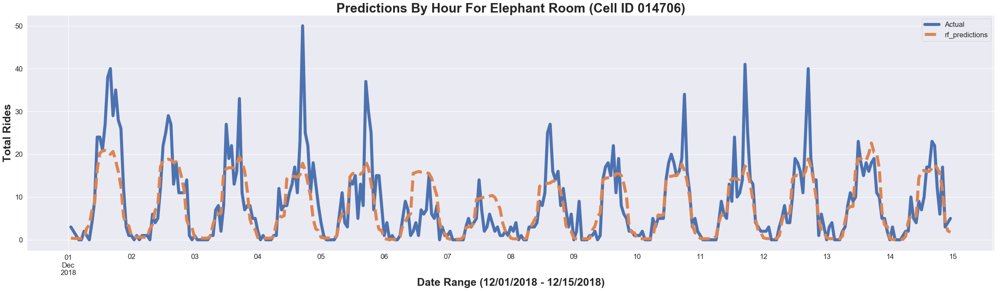

In [41]:

dec_1_dec_15 = test_results[(test_results.index > '2018-12-01') & (test_results.index < '2018-12-15')]

dec_1_dec_15.plot(style=['-', '--', ':'],figsize=(40, 10),linewidth=7.0)

plt.title('Predictions By Hour For Elephant Room (Cell ID 014706)', fontsize=30,fontweight='bold')
plt.ylabel('Total Rides',fontsize=25,fontweight='bold')
plt.xlabel('Date Range (12/01/2018 - 12/15/2018)', fontsize=25,fontweight='bold')
plt.savefig('../../output/Final/Random_Forest_Predictions_Elephant_Room_014706_Dec01_Dec15.png')

In [42]:
print("Median Prediction for Elephant Room ")
print(test_results['Actual'].median())
print(test_results['rf_predictions'].median())
print("Mean Prediction for Elephant Room")
print(test_results['Actual'].mean())
print(test_results['rf_predictions'].mean())

Median Prediction for Elephant Room 
5.0
5.470000000000001
Mean Prediction for Elephant Room
8.611185086551265
7.158388814913452


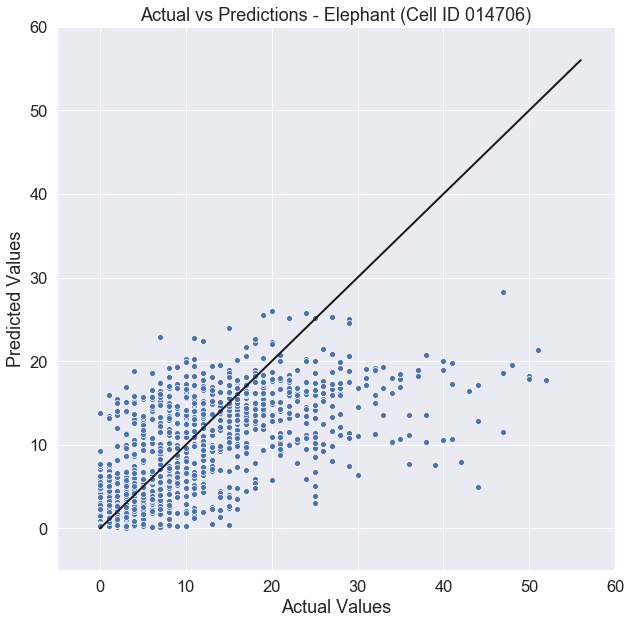

In [43]:

plt.figure(figsize=(10,10))
sns.scatterplot(x="Actual", y="rf_predictions", data=test_results)
plt.plot([test_results['Actual'].min(), (test_results['Actual'].max())-5], 
          [test_results['Actual'].min(),(test_results['Actual'].max()) -5], 'k', lw=2)
                                                                      
plt.ylim(-5,60)
plt.xlim(-5,60)
plt.title('Actual vs Predictions - Elephant (Cell ID 014706)')
plt.ylabel('Predicted Values')
plt.xlabel('Actual Values')
plt.savefig('../../output/Final/Actual_Prediction_Summary_Elephant_Room_014706.png')



#### Analyzing the peaks in cell 014706

In [44]:
### Analyzing results for Moody_Theatre_014706 cell

t = test_results
t['DAY_OF_WEEK'] = pd.DatetimeIndex(t.index).weekday
t['WEEKEND'] = ((pd.DatetimeIndex(t.index).weekday) // 5 == 1).astype(float)
t['WEEKDAY'] = ((pd.DatetimeIndex(t.index).weekday) // 5 == 0).astype(float)
t['HOUR'] = pd.DatetimeIndex(t.index).hour
hours=[0, 6, 10, 15, 19, 23]
t['HOUR_LABEL'] = pd.cut(t['HOUR'], hours, include_lowest=True, right=True, labels=['0', '1', '2', '3', '4'])
#t_12 = t[(t['DAY_OF_WEEK'] == 5) & ((t['HOUR_LABEL'] == '3') | (t['HOUR_LABEL'] == '4'))]
hour_label_3_4 = t[((t['HOUR_LABEL'] == '3') | (t['HOUR_LABEL'] == '4'))]
hour_label_3_4

,Actual,rf_predictions,DAY_OF_WEEK,WEEKEND,WEEKDAY,HOUR,HOUR_LABEL
Start Time,,,,,,,
2018-11-13 16:00:00,17,14.295,1,0.0,1.0,16,3
2018-11-13 17:00:00,7,16.380,1,0.0,1.0,17,3
2018-11-13 18:00:00,7,15.270,1,0.0,1.0,18,3
2018-11-13 19:00:00,2,13.545,1,0.0,1.0,19,3
2018-11-13 20:00:00,3,9.540,1,0.0,1.0,20,4
2018-11-13 21:00:00,1,3.815,1,0.0,1.0,21,4
2018-11-13 22:00:00,0,1.760,1,0.0,1.0,22,4
2018-11-13 23:00:00,0,1.415,1,0.0,1.0,23,4
2018-11-14 16:00:00,8,14.775,2,0.0,1.0,16,3


#### Run the same Random Forest model for the top 10 cells

Model Performance of Cell 014706
Model Performance
Mean Square Error: 44.69852825356102
Mean Absoulute Error: 4.1216013155688875
Score: 0.5257096518925966
Actual Results Mean: 8.611185086551265
Predictions Mean: 7.512923533266372
Actual Results Median: 5.0
Predictions Median: 5.986026078262272
Model Performance of Cell 014707
Model Performance
Mean Square Error: 31.03989098384384
Mean Absoulute Error: 3.6985689912931736
Score: 0.6070794758209372
Actual Results Mean: 8.027962716378163
Predictions Mean: 7.845263315485955
Actual Results Median: 5.0
Predictions Median: 5.569986705524437
Model Performance of Cell 014864
Model Performance
Mean Square Error: 31.230080780359742
Mean Absoulute Error: 3.6451807135347183
Score: 0.5357039286028937
Actual Results Mean: 7.506666666666667
Predictions Mean: 6.854331747970784
Actual Results Median: 5.0
Predictions Median: 5.773534884280668
Model Performance of Cell 014705
Model Performance
Mean Square Error: 24.510170687746655
Mean Absoulute Error: 3.1

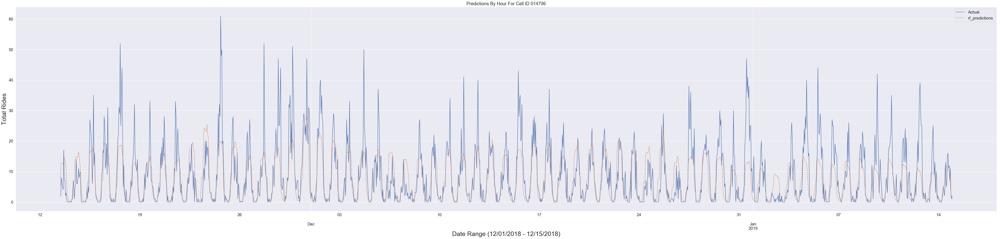

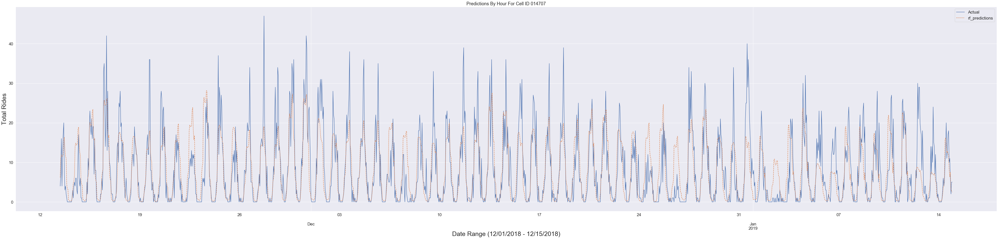

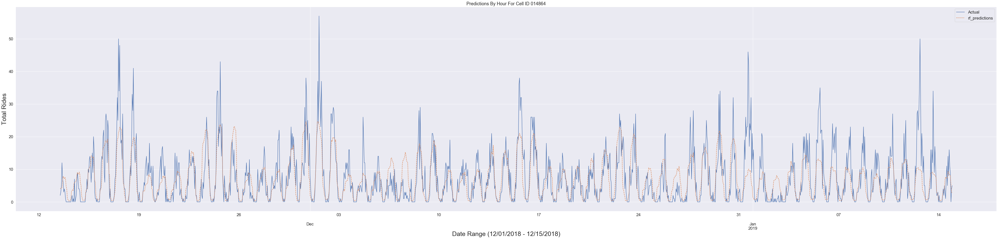

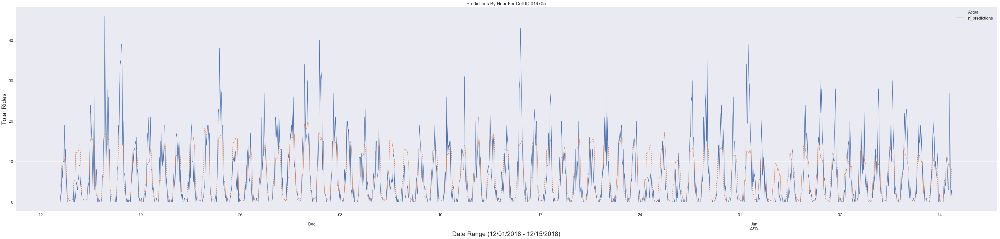

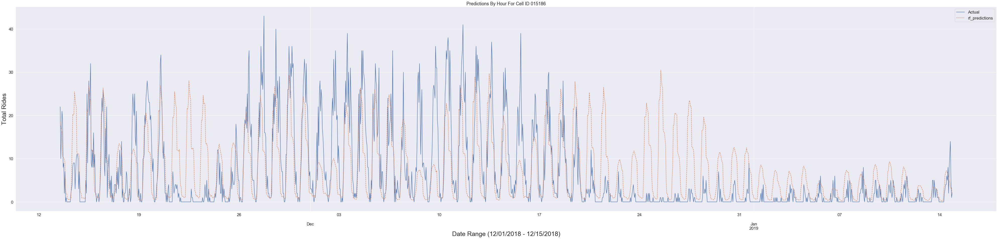

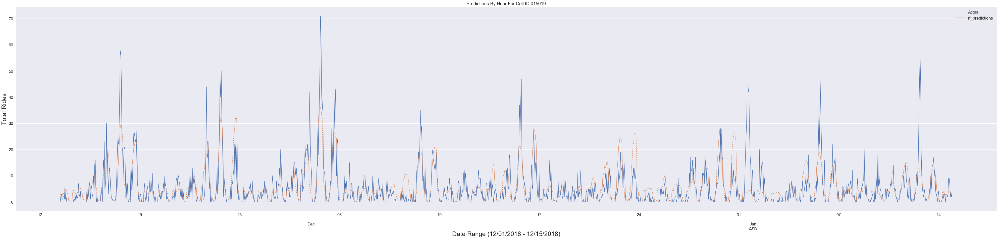

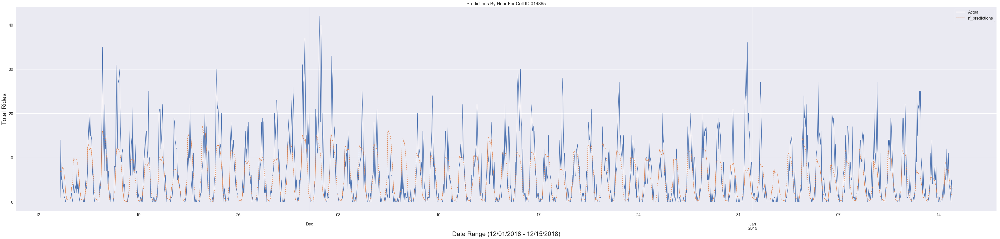

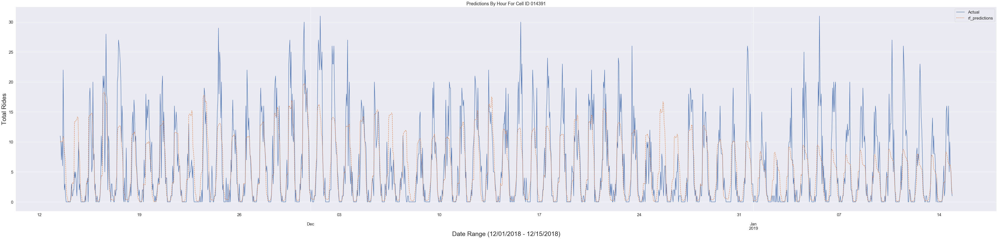

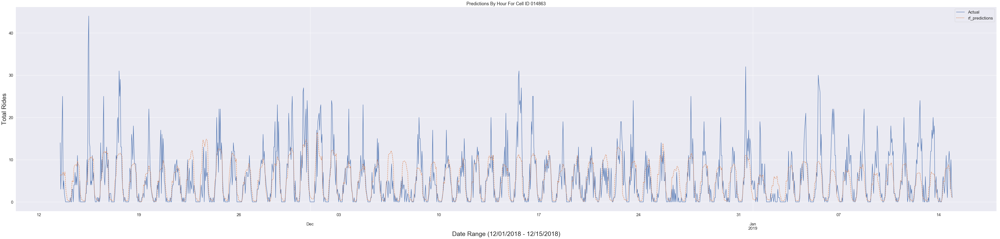

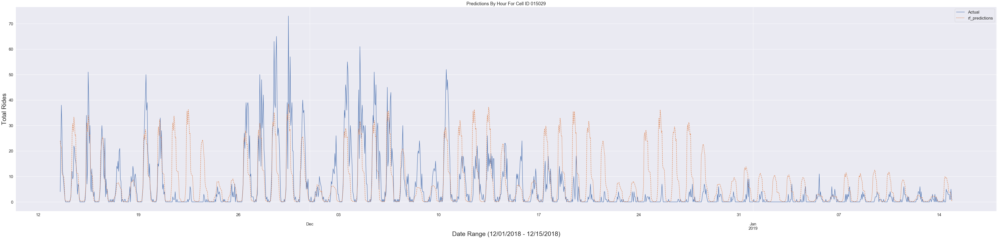

In [45]:
top_cell_list = ['014706','014707','014864','014705','015186','015019','014865','014391','014863','015029']
for item in top_cell_list:
    data_cell_data_hour = prepare_cell_data(dockless_data, weather_data, item)
    # Create the test train split the same way as the univariate time series so this is the same as ARIMA series
    size = int(len(data_cell_data_hour) * 0.66)
    train, test = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]

    y_train = train.pop('Trip Counts').values
    X_train = train.values
    y_test = test.pop('Trip Counts').values
    X_test = test.values

    best_rf = RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=90,
               max_features=7, max_leaf_nodes=None, min_impurity_decrease=0.0,
               min_impurity_split=None, min_samples_leaf=3,
               min_samples_split=12, min_weight_fraction_leaf=0.0,
               n_estimators=100, n_jobs=1, oob_score=False, random_state=0,
               verbose=0, warm_start=False)

    best_rf.fit(X_train, y_train)
    print("Model Performance of Cell {0}".format(item))

    best_random_forest_accuracy = evaluate(best_rf, X_test, y_test)
    best_rf_predictions = best_rf.predict(X_test)
   
    size = int(len(data_cell_data_hour) * 0.66)
    train_1, test_1 = data_cell_data_hour[0:size], data_cell_data_hour[size:len(data_cell_data_hour)]
    test_results = test_1.drop(['MONTH', 'YEAR', 'HOUR', 'DAY', 'WEEK', 'DAY_OF_WEEK',
           'WEEKEND', 'WEEKDAY',
           'AVG_DAILY_WIND_SPEED', 'PRECIPITATION', 'SNOW', 'AVG_TEMPERATURE', 'HOUR_LABEL',
           'MAX_TEMPERATURE', 'MIN_TEMPERATURE'], axis=1)
    test_results.rename(columns=dict(zip(["Trip Counts"], ["Actual"])), inplace=True)
    rf_list = best_rf_predictions.tolist()
    test_results['rf_predictions'] = rf_list
    
    print("Actual Results Mean: {0}".format(test_results['Actual'].mean()))
    print("Predictions Mean: {0}".format(test_results['rf_predictions'].mean()))
    print("Actual Results Median: {0}".format(test_results['Actual'].median()))
    print("Predictions Median: {0}".format(test_results['rf_predictions'].median()))

    test_results.plot(style=['-', '--', ':'],figsize=(70, 15))
    plt.title("Predictions By Hour For Cell ID {0}".format(item))
    plt.ylabel('Total Rides',fontsize=25)
    plt.xlabel('Date Range (12/01/2018 - 12/15/2018)', fontsize=25)
    filename = "../../output/Final/Random_Forest_Predictions_{0}_.png".format(item)
    plt.savefig(filename)
       

##### Model Performance of Cell 014706
    Model Performance
    Mean Square Error: 44.69852825356102
    Mean Absoulute Error: 4.1216013155688875
    Score: 0.5257096518925966
    Actual Results Mean: 8.611185086551265
    Predictions Mean: 7.512923533266372
    Actual Results Median: 5.0
    Predictions Median: 5.986026078262272
    
    
##### Model Performance of Cell 014707
    Model Performance
    Mean Square Error: 31.03989098384384
    Mean Absoulute Error: 3.6985689912931736
    Score: 0.6070794758209372
    Actual Results Mean: 8.027962716378163
    Predictions Mean: 7.845263315485955
    Actual Results Median: 5.0
    Predictions Median: 5.569986705524437

##### Model Performance of Cell 014864
    Model Performance
    Mean Square Error: 31.230080780359742
    Mean Absoulute Error: 3.6451807135347183
    Score: 0.5357039286028937
    Actual Results Mean: 7.506666666666667
    Predictions Mean: 6.854331747970784
    Actual Results Median: 5.0
    Predictions Median: 5.773534884280668

##### Model Performance of Cell 014705
    Model Performance
    Mean Square Error: 24.510170687746655
    Mean Absoulute Error: 3.1511167124197668
    Score: 0.567396233386424
    Actual Results Mean: 6.200532978014657
    Predictions Mean: 6.367707166460898
    Actual Results Median: 3.0
    Predictions Median: 5.549280740973854

### Model Performance of Cell 015186
    Model Performance
    Mean Square Error: 64.28464124877694
    Mean Absoulute Error: 5.3672448845529335
    Score: 0.24882400189455167
    Actual Results Mean: 6.549399198931909
    Predictions Mean: 7.4026571470395455
    Actual Results Median: 2.0
    Predictions Median: 4.088995971623462

##### Model Performance of Cell 015019
    Model Performance
    Mean Square Error: 35.59449504948863
    Mean Absoulute Error: 3.4768993110885176
    Score: 0.4826633940503422
    Actual Results Mean: 5.617842876165113
    Predictions Mean: 5.8454982369838016
    Actual Results Median: 3.0
    Predictions Median: 3.9928997693548354

##### Model Performance of Cell 014865
    Model Performance
    Mean Square Error: 26.704245232950285
    Mean Absoulute Error: 3.277778557901338
    Score: 0.45883764865246146
    Actual Results Mean: 6.225483655770514
    Predictions Mean: 5.076565469436607
    Actual Results Median: 4.0
    Predictions Median: 3.7061183092878913

##### Model Performance of Cell 014391
    Model Performance
    Mean Square Error: 18.45461480165581
    Mean Absoulute Error: 2.7454699528693496
    Score: 0.6052128357490097
    Actual Results Mean: 5.898666666666666
    Predictions Mean: 5.302398564866593
    Actual Results Median: 3.0
    Predictions Median: 3.5480839009071268

##### Model Performance of Cell 014863
    Model Performance
    Mean Square Error: 18.451079722600486
    Mean Absoulute Error: 2.7182176099803863
    Score: 0.4960142217119326
    Actual Results Mean: 5.314666666666667
    Predictions Mean: 4.884264574342746
    Actual Results Median: 3.0
    Predictions Median: 4.696610532575889

### Model Performance of Cell 015029
    Model Performance
    Mean Square Error: 84.89031591703511
    Mean Absoulute Error: 5.310513437714368
    Score: 0.1991362193282109
    Actual Results Mean: 5.423230974632844
    Predictions Mean: 7.0445466113214295
    Actual Results Median: 1.0
    Predictions Median: 2.5736063333035926



In [ ]:
# SARIMA Model Grid Search. Always took a long time to run and had to stop before it finished
data_014706_hourly = data_cell_data_hour['Trip Counts']
data = data_014706_hourly.values
data = data.astype('float32')
print(data.shape)
# data split
n_test = 3800
# model configs
cfg_list = sarima_configs()
# grid search
scores = grid_search(data, cfg_list, n_test,parallel=False)
print('done')
# list top 3 configs
for cfg, error in scores[:3]:
    print(cfg, error)

(4414,)
 > Model[[(0, 0, 0), (0, 0, 0, 0), 'n']] 5.001
 > Model[[(0, 0, 0), (0, 0, 1, 0), 'n']] 3.936
 > Model[[(0, 0, 0), (0, 0, 2, 0), 'n']] 3.565
 > Model[[(0, 0, 0), (1, 0, 0, 0), 'n']] 3.176
 > Model[[(0, 0, 0), (1, 0, 1, 0), 'n']] 3.089
 > Model[[(0, 0, 0), (1, 0, 2, 0), 'n']] 3.084
 > Model[[(0, 0, 0), (2, 0, 0, 0), 'n']] 3.088
 > Model[[(0, 0, 0), (2, 0, 1, 0), 'n']] 3.086
 > Model[[(0, 0, 0), (2, 0, 2, 0), 'n']] 3.069
 > Model[[(0, 0, 0), (0, 0, 0, 0), 'c']] 4.130
 > Model[[(0, 0, 0), (0, 0, 1, 0), 'c']] 3.471
 > Model[[(0, 0, 0), (0, 0, 2, 0), 'c']] 3.251
 > Model[[(0, 0, 0), (1, 0, 0, 0), 'c']] 3.081
 > Model[[(0, 0, 0), (1, 0, 1, 0), 'c']] 3.032
 > Model[[(0, 0, 0), (1, 0, 2, 0), 'c']] 3.024
 > Model[[(0, 0, 0), (0, 0, 1, 0), 't']] 3.626


##### CHI-SQUARE TEST FOR DOWNTOWN AND UT CELLS

In [99]:
# CHI-SQUARED TEST

downtown_6_congress_cell_data_hour = prepare_cell_data(dockless_data, weather_data, "014707")
ut_greogory_gym_cell_data_hour = prepare_cell_data(dockless_data, weather_data, "015029")

down_town_counts = downtown_6_congress_cell_data_hour[['Trip Counts']]
down_town_counts['HOUR'] = pd.DatetimeIndex(down_town_counts.index).hour
hours=[0, 6, 10, 15, 19, 23]
down_town_counts['HOUR_LABEL'] = pd.cut(down_town_counts['HOUR'], hours, include_lowest=True, right=True, labels=['0', '1', '2', '3', '4'])
down_town_counts.drop(['HOUR'], axis=1, inplace=True)
downtown_counts = (down_town_counts.groupby('HOUR_LABEL').sum())['Trip Counts']

ut_greogory_gym_cell_data_counts = ut_greogory_gym_cell_data_hour[['Trip Counts']]
ut_greogory_gym_cell_data_counts['HOUR'] = pd.DatetimeIndex(ut_greogory_gym_cell_data_counts.index).hour
hours=[0, 6, 10, 15, 19, 23]
ut_greogory_gym_cell_data_counts['HOUR_LABEL'] = pd.cut(ut_greogory_gym_cell_data_counts['HOUR'], hours, include_lowest=True, right=True, labels=['0', '1', '2', '3', '4'])
ut_greogory_gym_cell_data_counts.drop(['HOUR'], axis=1, inplace=True)
ut_counts = (ut_greogory_gym_cell_data_counts.groupby('HOUR_LABEL').sum())['Trip Counts']

print("Downtown Counts")
print(downtown_counts)

print("UT Counts")
print(ut_counts)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:3694: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  errors

Downtown Counts
HOUR_LABEL
0      658
1     3690
2    17517
3    12894
4     3660
Name: Trip Counts, dtype: int64
UT Counts
HOUR_LABEL
0      184
1     5028
2    12787
3     5527
4     1468
Name: Trip Counts, dtype: int64


In [101]:

# chi-squared test with similar proportions
from scipy.stats import chi2_contingency
from scipy.stats import chi2
# contingency table
table = [[658, 3690, 17517,12984,3660],[184,5028,12787,5527,1486]]
print("contingency table")
print(table)
stat, p, dof, expected = chi2_contingency(table)
print('degrees of freedom =%d' % dof)
print(expected)
# interpret test-statistic
prob = 0.95
critical = chi2.ppf(prob, dof)
print('probability=%.3f, critical=%.3f, stat=%.3f' % (prob, critical, stat))
if abs(stat) >= critical:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')
# interpret p-value
alpha = 1.0 - prob
print('significance=%.3f, p=%.3f' % (alpha, p))
if p <= alpha:
    print('Dependent (reject H0)')
else:
    print('Independent (fail to reject H0)')

contingency table
[[658, 3690, 17517, 12984, 3660], [184, 5028, 12787, 5527, 1486]]
degrees of freedom =4
[[  510.45446388  5285.20429464 18371.51077596 11222.11707939
   3119.71338612]
 [  331.54553612  3432.79570536 11932.48922404  7288.88292061
   2026.28661388]]
probability=0.950, critical=9.488, stat=2372.138
Dependent (reject H0)
significance=0.050, p=0.000
Dependent (reject H0)


#### Univariate Time Series

In [10]:
def plot_trend_data(ax, name, series):
    ax.plot(series.index, series)
    ax.set_title("Dockless Scooter Trend For {}".format(name))

def to_col_vector(arr):
    """Convert a one dimensional numpy array to a column vector."""
    return arr.reshape(-1, 1)

def make_design_matrix(arr):
    """Construct a design matrix from a numpy array, including an intercept term."""
    return sm.add_constant(to_col_vector(arr), prepend=False)

def fit_linear_trend(series):
    """Fit a linear trend to a time series.  Return the fit trend as a numpy array."""
    X = make_design_matrix(np.arange(len(series)) + 1)
    linear_trend_ols = sm.OLS(series.values, X).fit()
    linear_trend = linear_trend_ols.predict(X)
    return linear_trend

def plot_linear_trend(ax, name, series):
    linear_trend = fit_linear_trend(series)
    plot_trend_data(ax, name, series)
    ax.plot(series.index, linear_trend)
    
def fit_moving_average_trend(series, window=6):
    return series.rolling(window, center=True).mean()

def plot_moving_average_trend(ax, name, series, window=6):
    moving_average_trend = fit_moving_average_trend(series, window)
    plot_trend_data(ax, name, series)
    ax.set_title("Dockless Scooter Moving Average Trend For {}".format(name))
    ax.plot(series.index, moving_average_trend)
    
def create_monthly_dummies(series):
    month = series.index.month
    # Only take 11 of the 12 dummies to avoid strict colinearity.
    return pd.get_dummies(month).ix[:, :11]

def fit_seasonal_trend(series):
    dummies = create_monthly_dummies(series)
    X = sm.add_constant(dummies.values, prepend=False)
    seasonal_model = sm.OLS(series.values, X).fit()
    return seasonal_model.predict(X)

def plot_seasonal_trend(ax, name, series):
    seasons_average_trend = fit_seasonal_trend(series)
    plot_trend_data(ax, name, series)
    ax.set_title("Dockless Scooter Seasonality Trend For {}".format(name))
    ax.plot(series.index, seasons_average_trend)
    
def plot_seasonal_decomposition(axs, series, sd):
    axs[0].plot(series.index, series)
    axs[0].set_title("Raw Series")
    axs[1].plot(series.index, sd.trend)
    axs[1].set_title("Trend Component $T_t$")
    axs[2].plot(series.index, sd.seasonal)
    axs[2].set_title("Seasonal Component $S_t$")
    axs[3].plot(series.index, sd.resid)
    axs[3].set_title("Residual Component $R_t$")
    
def plot_series_and_difference(axs, series, title):
    diff = series.diff()
    axs[0].plot(series.index, series)
    axs[0].set_title("Raw Series: {}".format(title))
    axs[1].plot(series.index, diff)
    axs[1].set_title("Series of First Differences: {}".format(title))
    
def series_and_lagged(series, lag=1):
    truncated = np.copy(series)[lag:]
    lagged = np.copy(series)[:(len(truncated))]
    return truncated, lagged

def compute_autocorrelation(series, lag=1):
    series, lagged = series_and_lagged(series, lag=lag)
    return np.corrcoef(series, lagged)[0, 1]

def format_list_of_floats(L):
    return ["{0:2.2f}".format(f) for f in L]

In [11]:
### SARIMA Model

# one-step sarima forecast
def sarima_forecast(history, config):
    order, sorder, trend = config
    # define model
    model = SARIMAX(history, order=order, seasonal_order=sorder, trend=trend, enforce_stationarity=False, enforce_invertibility=False)
    # fit model
    model_fit = model.fit(disp=False)
    # make one step forecast
    yhat = model_fit.predict(len(history), len(history))
    return yhat[0]

# split a univariate dataset into train/test sets
def train_test_split(data, n_test):
    return data[:-n_test], data[-n_test:]

# root mean squared error or rmse
def measure_rmse(actual, predicted):
    return sqrt(mean_squared_error(actual, predicted))

# walk-forward validation for univariate data
def walk_forward_validation(data, n_test, cfg):
    predictions = list()
    # split dataset
    train, test = train_test_split(data, n_test)
    # seed history with training dataset
    history = [x for x in train]
    # step over each time-step in the test set
    for i in range(len(test)):
        # fit model and make forecast for history
        yhat = sarima_forecast(history, cfg)
        # store forecast in list of predictions
        predictions.append(yhat)
        # add actual observation to history for the next loop
        history.append(test[i])
    # estimate prediction error
    error = measure_rmse(test, predictions)
    return error

# score a model, return None on failure
def score_model(data, n_test, cfg, debug=False):
    result = None
    # convert config to a key
    key = str(cfg)
    # show all warnings and fail on exception if debugging
    if debug:
        result = walk_forward_validation(data, n_test, cfg)
    else:
        # one failure during model validation suggests an unstable config
        try:
            # never show warnings when grid searching, too noisy
            with catch_warnings():
                filterwarnings("ignore")
                result = walk_forward_validation(data, n_test, cfg)
        except:
            error = None
    # check for an interesting result
    if result is not None:
        print(' > Model[%s] %.3f' % (key, result))
    return (key, result)

# grid search configs
def grid_search(data, cfg_list, n_test, parallel=True):
    scores = None
    if parallel:
        # execute configs in parallel
        executor = Parallel(n_jobs=cpu_count(), backend='multiprocessing')
        tasks = (delayed(score_model)(data, n_test, cfg) for cfg in cfg_list)
        scores = executor(tasks)
    else:
        scores = [score_model(data, n_test, cfg) for cfg in cfg_list]
    # remove empty results
    scores = [r for r in scores if r[1] != None]
    # sort configs by error, asc
    scores.sort(key=lambda tup: tup[1])
    return scores

# create a set of sarima configs to try
def sarima_configs(seasonal=[0]):
    models = list()
    # define config lists
    p_params = [0, 1, 2]
    d_params = [0, 1]
    q_params = [0, 1, 2]
    t_params = ['n','c','t','ct']
    P_params = [0, 1, 2]
    D_params = [0, 1]
    Q_params = [0, 1, 2]
    m_params = seasonal
    # create config instances
    for p in p_params:
        for d in d_params:
            for q in q_params:
                for t in t_params:
                    for P in P_params:
                        for D in D_params:
                            for Q in Q_params:
                                for m in m_params:
                                    cfg = [(p,d,q), (P,D,Q,m), t]
                                    models.append(cfg)
    return models

In [48]:
data_cell_data_hour_014706 = prepare_cell_data(dockless_data, weather_data, "014706")
data_time_series_014706 = (data_cell_data_hour_014706['Trip Counts']).to_frame()

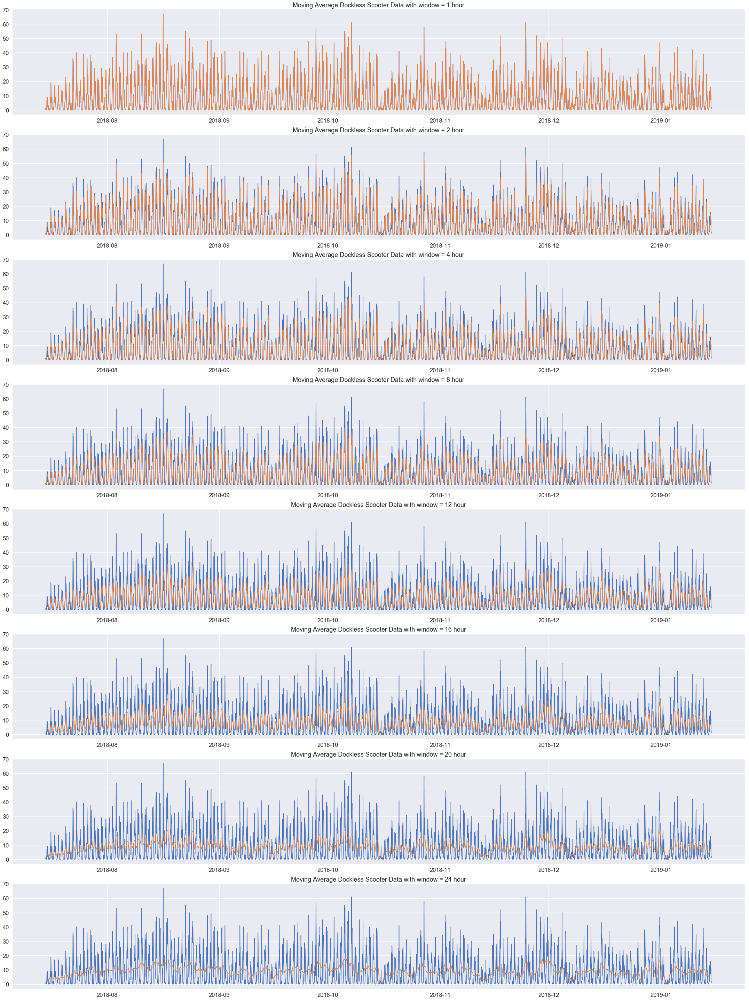

In [13]:
fig, axs = plt.subplots(8, figsize=(30, 40))

for i, window in enumerate([1, 2, 4, 8, 12, 16, 20, 24]):
    axs[i].plot(data_time_series_014706.index, data_time_series_014706)
    axs[i].plot(data_time_series_014706.index, fit_moving_average_trend(data_time_series_014706, window=window))
    axs[i].set_title("Moving Average Dockless Scooter Data with window = {} hour".format(window))
      
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Moving_Average_014706.png") 
plt.tight_layout()


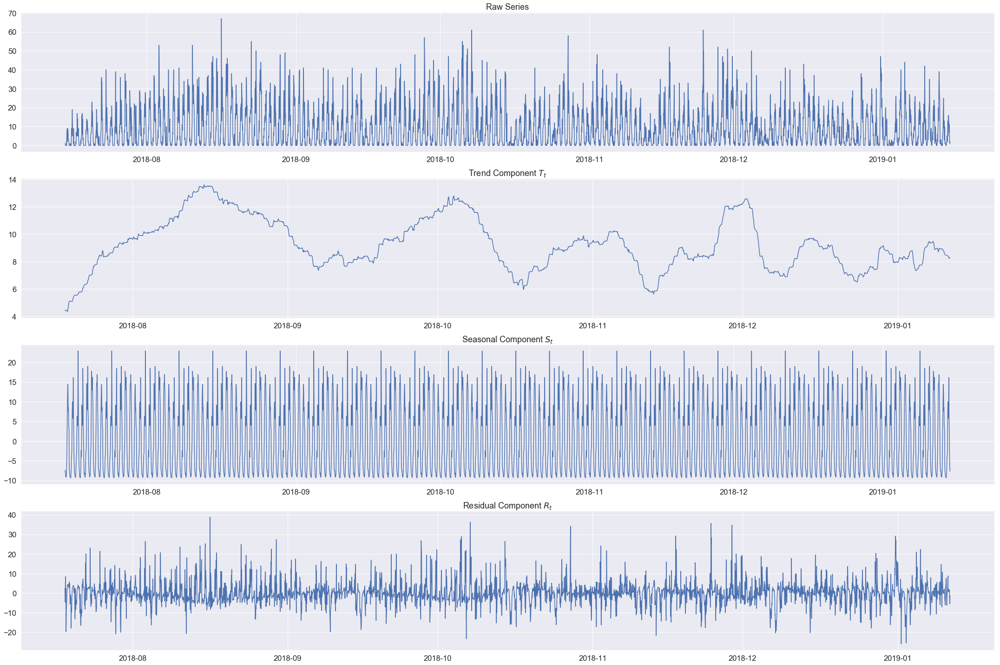

In [15]:
data_time_series_014706_decomposition = sm.tsa.seasonal_decompose(data_time_series_014706, freq=(24*7))

fig, axs = plt.subplots(4, figsize=(30, 20))
plot_seasonal_decomposition(axs, data_time_series_014706, data_time_series_014706_decomposition)
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Seasonal_Decomposition_014706.png") 
plt.tight_layout()

In [49]:
# Augmented Dickey-Fuller test 

test = sm.tsa.stattools.adfuller(data_time_series_014706['Trip Counts'])
print("ADF p-value for 014706 series: {0:2.2f}".format(test[1]))

test = sm.tsa.stattools.adfuller(data_time_series_014706['Trip Counts'].diff()[1:])
print("ADF p-value for differenced python series: {0:2.2f}".format(test[1]))

ADF p-value for 014706 series: 0.00
ADF p-value for differenced python series: 0.00


In [50]:
hourly_014706_diff = data_time_series_014706['Trip Counts'].diff()[1:]

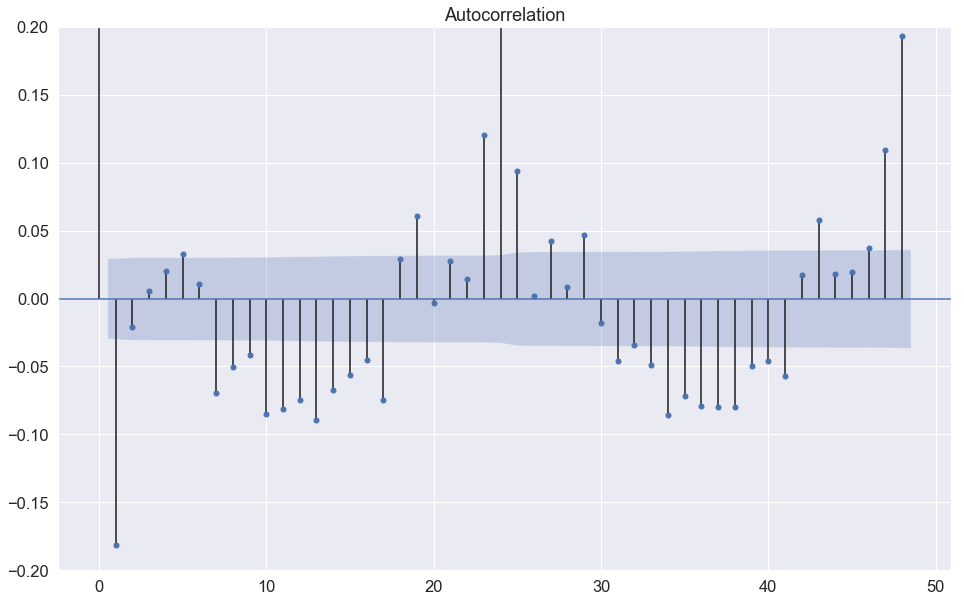

In [18]:
## Lags is 2*24 - 24 hours

fig, ax = plt.subplots(1, figsize=(16, 10))

_ = sm.graphics.tsa.plot_acf(hourly_014706_diff, lags=2*24, ax=ax)
ax.set_ylim([-0.2,0.2])
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Auto_Correlation_014706.png") 


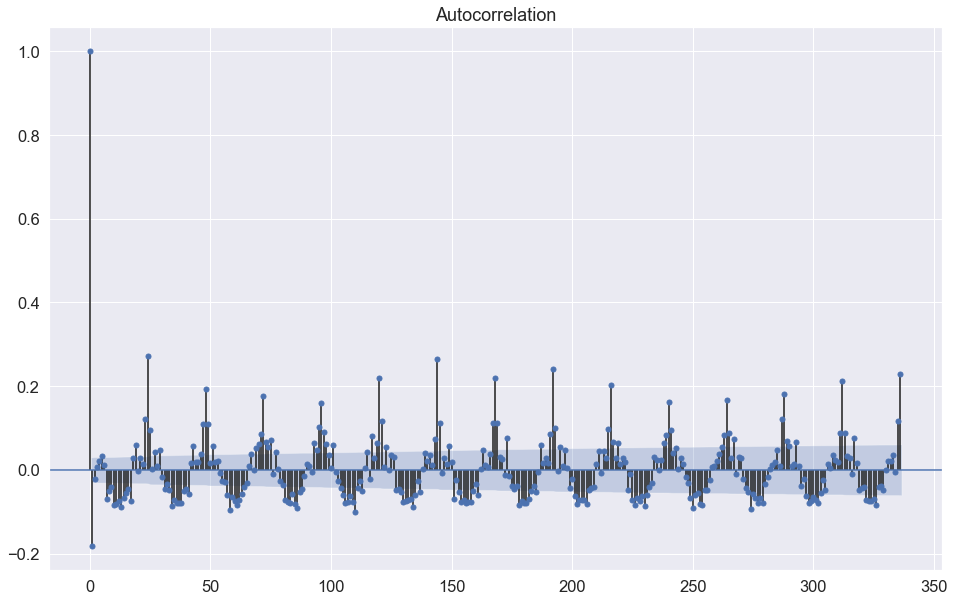

In [19]:
## Lags is 24 - 24 hours

fig, ax = plt.subplots(1, figsize=(16, 10))

_ = sm.graphics.tsa.plot_acf(hourly_014706_diff, lags=14*24, ax=ax)
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Auto_Correlation_014706_Two_Weeks.png") 
#ax.set_ylim([-0.2,0.2])

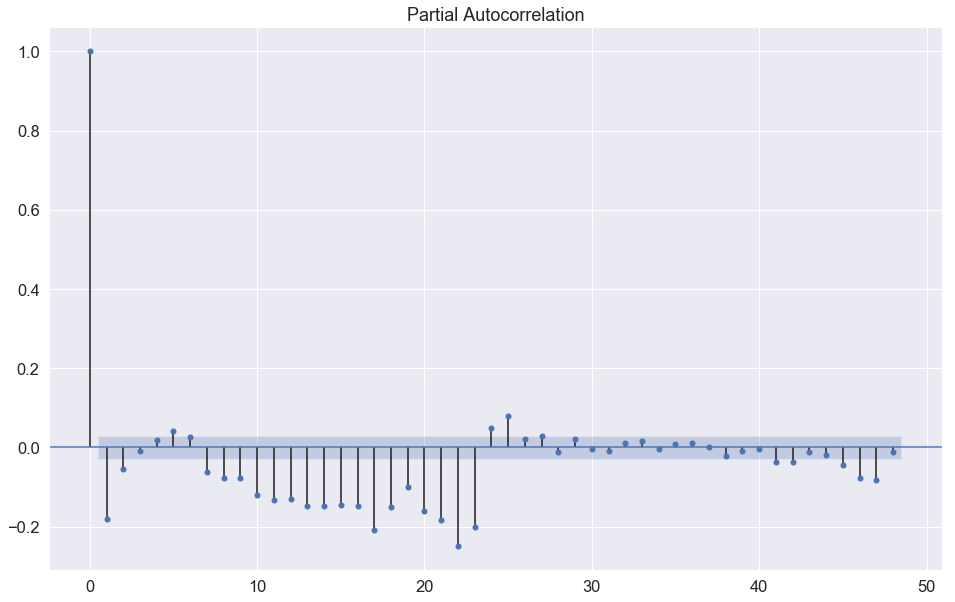

In [20]:
# Lags is 24 - 24 hours

fig, ax = plt.subplots(1, figsize=(16, 10))

_ = sm.graphics.tsa.plot_pacf(hourly_014706_diff, lags=2*24, ax=ax, method='ywmle')
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Partial_Auto_Correlation_2_days_014706.png") 

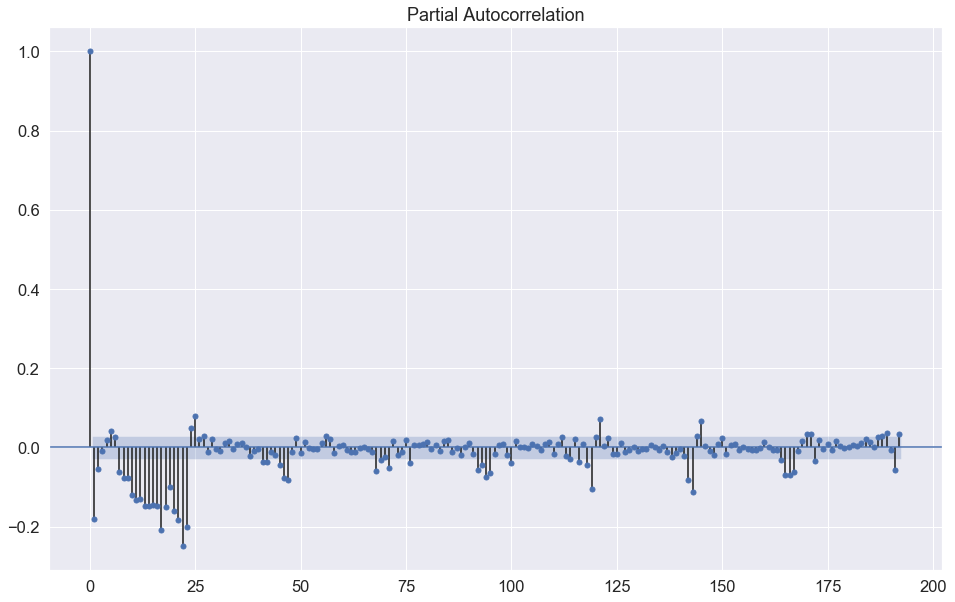

In [21]:
# Lags is 24 - 24 hours

fig, ax = plt.subplots(1, figsize=(16, 10))

_ = sm.graphics.tsa.plot_pacf(hourly_014706_diff, lags=8*24, ax=ax, method='ywmle')
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Partial_Auto_Correlation_8_days_014706.png") 

In [54]:
X = data_time_series_014706['Trip Counts']

size = int(len(X) * 0.75)
train, test = X[0:size], X[size:len(X)]
model = SARIMAX(train, order=(2, 1, 1), seasonal_order=(2, 0, 2, 24)).fit()

/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  % freq, ValueWarning)


In [61]:
test

Start Time
2018-11-30 00:00:00     6
2018-11-30 01:00:00     7
2018-11-30 02:00:00     7
2018-11-30 03:00:00     1
2018-11-30 04:00:00     2
2018-11-30 05:00:00     0
2018-11-30 06:00:00     1
2018-11-30 07:00:00     8
2018-11-30 08:00:00    11
2018-11-30 09:00:00    12
2018-11-30 10:00:00    18
2018-11-30 11:00:00    26
2018-11-30 12:00:00    29
2018-11-30 13:00:00    27
2018-11-30 14:00:00    22
2018-11-30 15:00:00    25
2018-11-30 16:00:00    20
2018-11-30 17:00:00    47
2018-11-30 18:00:00    24
2018-11-30 19:00:00    19
2018-11-30 20:00:00    31
2018-11-30 21:00:00    30
2018-11-30 22:00:00    25
2018-11-30 23:00:00     6
2018-12-01 00:00:00     1
2018-12-01 01:00:00     3
2018-12-01 02:00:00     2
2018-12-01 03:00:00     1
2018-12-01 04:00:00     0
2018-12-01 05:00:00     0
                       ..
2019-01-13 18:00:00    13
2019-01-13 19:00:00     3
2019-01-13 20:00:00    10
2019-01-13 21:00:00     7
2019-01-13 22:00:00     1
2019-01-13 23:00:00     2
2019-01-14 00:00:00     1
2

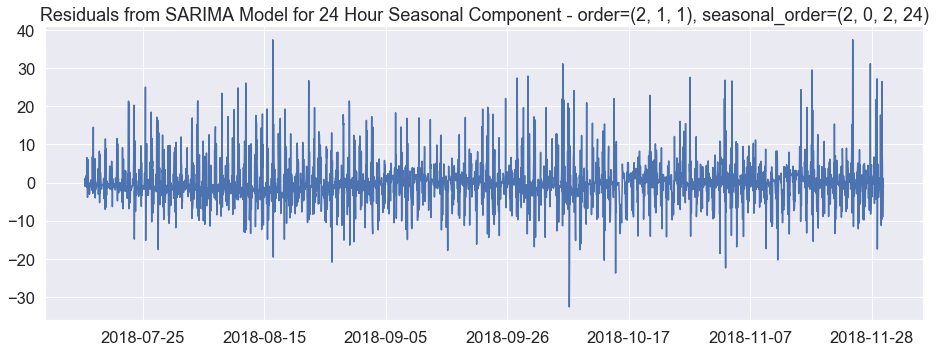

In [23]:
fig, ax = plt.subplots(1, figsize=(14, 5))
ax.plot(model.resid.index, model.resid)
ax.set_title("Residuals from SARIMA Model for 24 Hour Seasonal Component - order=(2, 1, 1), seasonal_order=(2, 0, 2, 24)")
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/Residuals_SARIMA_014706.png")
plt.tight_layout()

Text(0.5,106.5,'Date Range (11/29/2018 - 01/30/2019)')

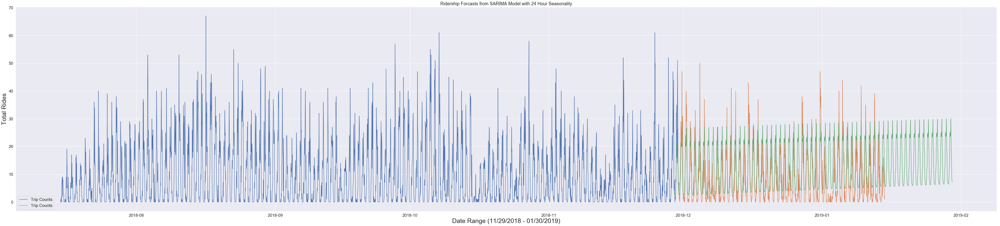

In [25]:
fig, ax = plt.subplots(1, figsize=(70, 15))
ax.plot(train.index, train)
ax.plot(test)
preds = model.predict('2018-11-29', '2019-01-30', dynamic=True, ax=ax, plot_insample=False)

ax.plot(preds.index, preds)

_ = ax.legend().get_texts()[1].set_text("95% Prediction Interval")
_ = ax.legend(loc="lower left")

_ = ax.set_title("Ridership Forcasts from SARIMA Model with 24 Hour Seasonality")
#ax.set_xlim([0, 40])
#ax.set_ylim([2.4, 3.5])
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/SARIMA_Forecast_24hour_Seasonal_014706.png") 
ax.set_ylabel("Total Rides",fontsize=25)
ax.set_xlabel("Date Range (11/29/2018 - 01/30/2019)", fontsize=25)


In [130]:
## This cell does not run. Gives LU Decomposition Error

X = data_time_series_014706['Trip Counts'].values
X = X.astype('float32')
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
sarima_predictions = list()
for t in range(len(test)):
    #model = ARIMA(history, order=(0,1,2))
    model = SARIMAX(endog=history, order=(2, 1, 1), seasonal_order=(2, 0, 2, 24))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    sarima_predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, sarima_predictions)
print('Test MSE: %.3f' % error)
# plot
# plt.plot(test)
# plt.plot(predictions, color='red')
# plt.show()

predicted=7.559196, expected=2.000000
predicted=10.441402, expected=2.000000


/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


predicted=12.897964, expected=8.000000
predicted=11.640159, expected=6.000000


/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


predicted=10.694180, expected=5.000000
predicted=9.407209, expected=4.000000
predicted=9.494161, expected=17.000000


/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


predicted=18.174409, expected=7.000000


/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


predicted=9.151919, expected=7.000000
predicted=6.028824, expected=2.000000


LinAlgError: LU decomposition error.

/anaconda3/lib/python3.6/site-packages/statsmodels/tsa/base/tsa_model.py:165: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  % freq, ValueWarning)
/anaconda3/lib/python3.6/site-packages/statsmodels/base/model.py:507: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


Text(0.5,61.5,'Date Range (11/29/2018 - 01/30/2019)')

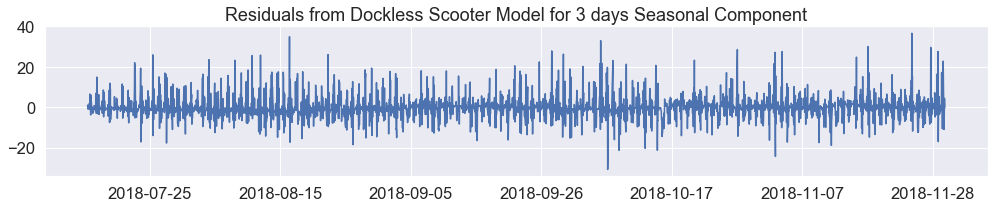

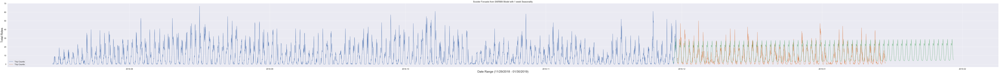

In [26]:
# Run the SARIMA with 1 week seasonality
X = data_time_series_014706['Trip Counts']
#X = X.astype('float32')

size = int(len(X) * 0.75)
train, test = X[0:size], X[size:len(X)]
model = SARIMAX(train, order=(2, 1, 1), seasonal_order=(3, 0, 2, 24)).fit()
fig, ax = plt.subplots(1, figsize=(14, 3))
ax.plot(model.resid.index, model.resid)
ax.set_title("Residuals from Dockless Scooter Model for 3 days Seasonal Component")
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/SARIMA_Residuals_3days_Seasonal_014706.png") 
plt.tight_layout()

fig, ax = plt.subplots(1, figsize=(70, 15))
ax.plot(train.index, train)
ax.plot(test)
preds = model.predict('2018-11-29', '2019-01-30', dynamic=True, ax=ax, plot_insample=False)

ax.plot(preds.index, preds)

_ = ax.legend().get_texts()[1].set_text("95% Prediction Interval")
_ = ax.legend(loc="lower left")

_ = ax.set_title("Scooter Forcasts from SARIMA Model with 1 week Seasonality")
#ax.set_xlim([0, 40])
#ax.set_ylim([2.4, 3.5])
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/SARIMA_Forecast_3days_Seasonal_014706.png") 
ax.set_ylabel("Total Rides",fontsize=25)
ax.set_xlabel("Date Range (11/29/2018 - 01/30/2019)", fontsize=25)

Text(0.5,106.5,'Date Range (11/29/2018 - 01/30/2019)')

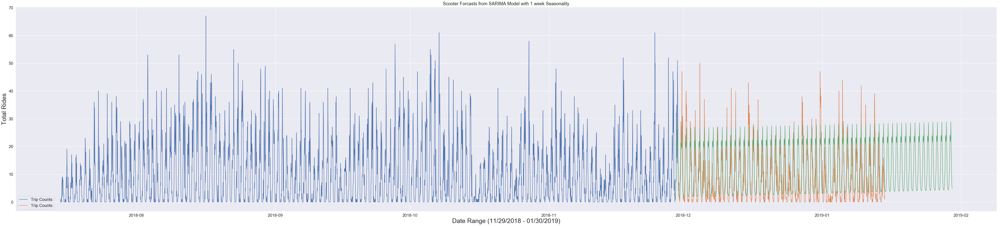

In [28]:
fig, ax = plt.subplots(1, figsize=(70, 15))
ax.plot(train.index, train)
ax.plot(test)
preds = model.predict('2018-11-29', '2019-01-30', dynamic=True, ax=ax, plot_insample=False)

ax.plot(preds.index, preds)

_ = ax.legend().get_texts()[1].set_text("95% Prediction Interval")
_ = ax.legend(loc="lower left")

_ = ax.set_title("Scooter Forcasts from SARIMA Model with 1 week Seasonality")
#ax.set_xlim([0, 40])
#ax.set_ylim([2.4, 3.5])
plt.savefig("../../output/Final/Presentation/Univariant_TimeSeries/SARIMA_Forecast_3days_Seasonal_014706.png") 
ax.set_ylabel("Total Rides",fontsize=25)
ax.set_xlabel("Date Range (11/29/2018 - 01/30/2019)", fontsize=25)

In [65]:
sarima_predictions = model.predict('2018-11-30', '2019-01-15', dynamic=True)
print("SARIMA Predictions")
#print("Mean Absoulute Error:", mean_absolute_error(test, sarima_predictions))
sarima_predictions = sarima_predictions[:-1]
print("Mean Absoulute Error:", mean_absolute_error(test, sarima_predictions))

SARIMA Predictions
Mean Absoulute Error: 8.010622709743835


##### ARIMA Models - AR and MA

In [52]:
# Auto Rregressor Model

X = data_time_series_014706['Trip Counts']
X = X.astype('float32')
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
ar_predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(2,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    ar_predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
mean_square_error = mean_squared_error(test, ar_predictions)
print('Test MSE: %.3f' % mean_square_error)

print("Mean Absoulute Error:", mean_absolute_error(test, ar_predictions))
# # plot
# plt.plot(test)
# plt.plot(ar_predictions, color='red')
# plt.show()

predicted=7.703581, expected=2.000000
predicted=3.049271, expected=2.000000
predicted=2.360789, expected=8.000000
predicted=6.954186, expected=6.000000
predicted=5.990127, expected=5.000000
predicted=5.297178, expected=4.000000
predicted=4.236408, expected=17.000000
predicted=14.793293, expected=7.000000
predicted=7.972249, expected=7.000000
predicted=7.607776, expected=2.000000
predicted=2.877677, expected=3.000000
predicted=3.126231, expected=1.000000
predicted=1.290830, expected=0.000000
predicted=0.295242, expected=0.000000
predicted=0.059697, expected=0.000000
predicted=-0.000402, expected=0.000000
predicted=-0.000400, expected=0.000000
predicted=-0.000402, expected=0.000000
predicted=-0.000401, expected=0.000000
predicted=-0.000403, expected=0.000000
predicted=-0.000401, expected=1.000000
predicted=0.824585, expected=1.000000
predicted=0.939922, expected=7.000000
predicted=5.949981, expected=5.000000
predicted=4.992238, expected=1.000000
predicted=1.822196, expected=5.000000
pred

predicted=-0.000378, expected=0.000000
predicted=-0.000378, expected=1.000000
predicted=0.819360, expected=5.000000
predicted=4.217787, expected=8.000000
predicted=7.216176, expected=6.000000
predicted=6.179273, expected=7.000000
predicted=6.944374, expected=13.000000
predicted=11.860154, expected=10.000000
predicted=10.177262, expected=12.000000
predicted=11.827007, expected=19.000000
predicted=17.620296, expected=10.000000
predicted=11.200843, expected=10.000000
predicted=10.558025, expected=4.000000
predicted=5.085976, expected=10.000000
predicted=9.285409, expected=0.000000
predicted=1.446161, expected=8.000000
predicted=7.158204, expected=7.000000
predicted=6.697448, expected=4.000000
predicted=4.607014, expected=0.000000
predicted=0.908468, expected=0.000000
predicted=0.243162, expected=1.000000
predicted=0.818509, expected=0.000000
predicted=0.120234, expected=0.000000
predicted=0.060529, expected=0.000000
predicted=-0.000375, expected=0.000000
predicted=-0.000376, expected=0.00

predicted=2.904183, expected=2.000000
predicted=2.076537, expected=1.000000
predicted=1.242942, expected=0.000000
predicted=0.242553, expected=0.000000
predicted=0.055234, expected=2.000000
predicted=1.625755, expected=1.000000
predicted=1.076133, expected=0.000000
predicted=0.242579, expected=4.000000
predicted=3.307393, expected=9.000000
predicted=7.844280, expected=24.000000
predicted=20.931785, expected=24.000000
predicted=23.182324, expected=21.000000
predicted=21.566864, expected=27.000000
predicted=26.056084, expected=38.000000
predicted=35.633007, expected=40.000000
predicted=39.035252, expected=29.000000
predicted=30.946183, expected=35.000000
predicted=34.508634, expected=28.000000
predicted=28.982726, expected=26.000000
predicted=26.771049, expected=12.000000
predicted=14.720188, expected=3.000000
predicted=5.433270, expected=1.000000
predicted=1.858572, expected=1.000000
predicted=1.108518, expected=0.000000
predicted=0.184578, expected=1.000000
predicted=0.869321, expected

predicted=2.619520, expected=2.000000
predicted=2.168724, expected=1.000000
predicted=1.187679, expected=1.000000
predicted=1.056118, expected=1.000000
predicted=1.000016, expected=2.000000
predicted=1.812703, expected=0.000000
predicted=0.318907, expected=0.000000
predicted=0.111873, expected=0.000000
predicted=-0.000335, expected=5.000000
predicted=4.063075, expected=3.000000
predicted=3.095571, expected=5.000000
predicted=4.738121, expected=5.000000
predicted=4.889288, expected=5.000000
predicted=5.001412, expected=14.000000
predicted=12.315214, expected=18.000000
predicted=16.752086, expected=20.000000
predicted=19.408576, expected=18.000000
predicted=18.268899, expected=15.000000
predicted=15.678702, expected=16.000000
predicted=15.985643, expected=19.000000
predicted=18.388345, expected=34.000000
predicted=31.038006, expected=16.000000
predicted=18.550408, expected=11.000000
predicted=12.963418, expected=3.000000
predicted=4.777563, expected=5.000000
predicted=5.072994, expected=

predicted=18.036601, expected=26.000000
predicted=24.694029, expected=16.000000
predicted=17.482972, expected=10.000000
predicted=11.722082, expected=14.000000
predicted=13.573619, expected=4.000000
predicted=5.702477, expected=1.000000
predicted=2.141041, expected=11.000000
predicted=9.247161, expected=0.000000
predicted=1.556052, expected=0.000000
predicted=0.624980, expected=0.000000
predicted=-0.000317, expected=2.000000
predicted=1.614286, expected=0.000000
predicted=0.272151, expected=0.000000
predicted=0.113315, expected=0.000000
predicted=-0.000316, expected=3.000000
predicted=2.421544, expected=2.000000
predicted=2.022949, expected=4.000000
predicted=3.671686, expected=5.000000
predicted=4.694711, expected=8.000000
predicted=7.366515, expected=6.000000
predicted=6.217453, expected=5.000000
predicted=5.307936, expected=11.000000
predicted=9.901733, expected=10.000000
predicted=9.854988, expected=14.000000
predicted=13.288762, expected=21.000000
predicted=19.429246, expected=18.

predicted=32.918745, expected=24.000000
predicted=25.422393, expected=24.000000
predicted=24.812965, expected=36.000000
predicted=33.665451, expected=24.000000
predicted=25.658609, expected=14.000000
predicted=16.666676, expected=16.000000
predicted=16.203253, expected=18.000000
predicted=17.496459, expected=12.000000
predicted=13.058299, expected=24.000000
predicted=22.011893, expected=8.000000
predicted=10.441639, expected=4.000000
predicted=5.730437, expected=0.000000
predicted=1.017750, expected=0.000000
predicted=0.233983, expected=0.000000
predicted=-0.000300, expected=0.000000
predicted=-0.000300, expected=0.000000
predicted=-0.000300, expected=0.000000
predicted=-0.000301, expected=0.000000
predicted=-0.000299, expected=1.000000
predicted=0.804121, expected=4.000000
predicted=3.354762, expected=3.000000
predicted=3.020829, expected=9.000000
predicted=7.885630, expected=12.000000
predicted=11.065241, expected=15.000000
predicted=14.242242, expected=17.000000
predicted=16.438807,

predicted=0.140128, expected=1.000000
predicted=0.859592, expected=3.000000
predicted=2.556339, expected=10.000000
predicted=8.530123, expected=16.000000
predicted=14.456928, expected=44.000000
predicted=38.275006, expected=28.000000
predicted=29.622868, expected=22.000000
predicted=24.047669, expected=24.000000
predicted=23.945523, expected=29.000000
predicted=27.926186, expected=25.000000
predicted=25.511571, expected=14.000000
predicted=16.362813, expected=18.000000
predicted=17.832854, expected=16.000000
predicted=16.173602, expected=1.000000
predicted=4.027308, expected=6.000000
predicted=5.857965, expected=0.000000
predicted=0.893132, expected=2.000000
predicted=1.940257, expected=4.000000
predicted=3.501673, expected=0.000000
predicted=0.668616, expected=0.000000
predicted=0.219651, expected=0.000000
predicted=-0.000285, expected=0.000000
predicted=-0.000284, expected=0.000000
predicted=-0.000283, expected=0.000000
predicted=-0.000284, expected=3.000000
predicted=2.416500, expec

predicted=-0.000271, expected=0.000000
predicted=-0.000272, expected=1.000000
predicted=0.809014, expected=2.000000
predicted=1.753977, expected=5.000000
predicted=4.372912, expected=4.000000
predicted=4.025912, expected=2.000000
predicted=2.437584, expected=5.000000
predicted=4.538842, expected=13.000000
predicted=11.309979, expected=5.000000
predicted=6.086021, expected=6.000000
predicted=6.254602, expected=15.000000
predicted=13.227661, expected=16.000000
predicted=15.310830, expected=11.000000
predicted=11.902330, expected=12.000000
predicted=12.092027, expected=7.000000
predicted=7.901331, expected=11.000000
predicted=10.517591, expected=2.000000
predicted=3.499031, expected=1.000000
predicted=1.692937, expected=2.000000
Test MSE: 41.826
Mean Absoulute Error: 4.167614755452761


In [53]:
# Moving Average Model
X = data_time_series_014706['Trip Counts']
X = X.astype('float32')
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
ma_predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(0,1,2))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    ma_predictions.append(yhat)
    obs = test[t]
    history.append(obs)
    print('predicted=%f, expected=%f' % (yhat, obs))
error = mean_squared_error(test, ma_predictions)
print('Test MSE: %.3f' % error)

print("Mean Absoulute Error:", mean_absolute_error(test, ma_predictions))
# plot
# plt.plot(test)
# plt.plot(ma_predictions, color='red')
# plt.show()

predicted=7.728731, expected=2.000000
predicted=2.975016, expected=2.000000
predicted=2.310569, expected=8.000000
predicted=7.037492, expected=6.000000
predicted=6.041445, expected=5.000000
predicted=5.208153, expected=4.000000
predicted=4.236920, expected=17.000000
predicted=14.814887, expected=7.000000
predicted=8.051357, expected=7.000000
predicted=7.378186, expected=2.000000
predicted=2.964808, expected=3.000000
predicted=3.126396, expected=1.000000
predicted=1.370283, expected=0.000000
predicted=0.290801, expected=0.000000
predicted=0.083912, expected=0.000000
predicted=0.021430, expected=0.000000
predicted=0.005469, expected=0.000000
predicted=0.001157, expected=0.000000
predicted=0.000014, expected=0.000000
predicted=-0.000291, expected=0.000000
predicted=-0.000374, expected=1.000000
predicted=0.825399, expected=1.000000
predicted=0.945100, expected=7.000000
predicted=5.940982, expected=5.000000
predicted=5.017929, expected=1.000000
predicted=1.724261, expected=5.000000
predicte

predicted=4.227996, expected=8.000000
predicted=7.230346, expected=6.000000
predicted=6.136664, expected=7.000000
predicted=6.874913, expected=13.000000
predicted=11.884854, expected=10.000000
predicted=10.202021, expected=12.000000
predicted=11.723426, expected=19.000000
predicted=17.658873, expected=10.000000
predicted=11.214443, expected=10.000000
predicted=10.395460, expected=4.000000
predicted=5.177655, expected=10.000000
predicted=9.279772, expected=0.000000
predicted=1.564717, expected=8.000000
predicted=7.043999, expected=7.000000
predicted=6.868924, expected=4.000000
predicted=4.520004, expected=0.000000
predicted=0.878810, expected=0.000000
predicted=0.257847, expected=1.000000
predicted=0.885449, expected=0.000000
predicted=0.143169, expected=0.000000
predicted=0.045054, expected=0.000000
predicted=0.010989, expected=0.000000
predicted=0.002675, expected=0.000000
predicted=0.000425, expected=1.000000
predicted=0.819651, expected=0.000000
predicted=0.125629, expected=4.000000

predicted=0.257988, expected=0.000000
predicted=0.072253, expected=2.000000
predicted=1.643913, expected=1.000000
predicted=1.083483, expected=0.000000
predicted=0.215285, expected=4.000000
predicted=3.312254, expected=9.000000
predicted=7.863368, expected=24.000000
predicted=20.882908, expected=24.000000
predicted=23.117073, expected=21.000000
predicted=21.340241, expected=27.000000
predicted=25.991933, expected=38.000000
predicted=35.665336, expected=40.000000
predicted=38.975637, expected=29.000000
predicted=30.778614, expected=35.000000
predicted=34.419037, expected=28.000000
predicted=29.124183, expected=26.000000
predicted=26.714338, expected=12.000000
predicted=14.802976, expected=3.000000
predicted=5.463477, expected=1.000000
predicted=2.043858, expected=1.000000
predicted=1.275568, expected=0.000000
predicted=0.254928, expected=1.000000
predicted=0.885795, expected=0.000000
predicted=0.149807, expected=1.000000
predicted=0.859109, expected=1.000000
predicted=0.958208, expected

predicted=1.017766, expected=2.000000
predicted=1.817071, expected=0.000000
predicted=0.321554, expected=0.000000
predicted=0.096631, expected=0.000000
predicted=0.024350, expected=5.000000
predicted=4.067875, expected=3.000000
predicted=3.101420, expected=5.000000
predicted=4.665637, expected=5.000000
predicted=4.900270, expected=5.000000
predicted=4.975693, expected=14.000000
predicted=12.305224, expected=18.000000
predicted=16.755359, expected=20.000000
predicted=19.283530, expected=18.000000
predicted=18.180795, expected=15.000000
predicted=15.626360, expected=16.000000
predicted=15.997857, expected=19.000000
predicted=18.434319, expected=34.000000
predicted=31.032245, expected=16.000000
predicted=18.522733, expected=11.000000
predicted=12.726212, expected=3.000000
predicted=4.976586, expected=5.000000
predicted=5.194315, expected=2.000000
predicted=2.598801, expected=1.000000
predicted=1.364244, expected=0.000000
predicted=0.287816, expected=0.000000
predicted=0.081171, expected=0

predicted=5.823984, expected=1.000000
predicted=2.100014, expected=11.000000
predicted=9.374627, expected=0.000000
predicted=1.652925, expected=0.000000
predicted=0.485132, expected=0.000000
predicted=0.122720, expected=2.000000
predicted=1.646296, expected=0.000000
predicted=0.284449, expected=0.000000
predicted=0.083916, expected=0.000000
predicted=0.021009, expected=3.000000
predicted=2.426572, expected=2.000000
predicted=2.029790, expected=4.000000
predicted=3.627769, expected=5.000000
predicted=4.701072, expected=8.000000
predicted=7.340405, expected=6.000000
predicted=6.201825, expected=5.000000
predicted=5.256969, expected=11.000000
predicted=9.914457, expected=10.000000
predicted=9.883986, expected=14.000000
predicted=13.206851, expected=21.000000
predicted=19.428556, expected=18.000000
predicted=18.142681, expected=13.000000
predicted=14.021094, expected=9.000000
predicted=10.062668, expected=8.000000
predicted=8.489265, expected=1.000000
predicted=2.480041, expected=2.000000


predicted=13.082568, expected=24.000000
predicted=21.966774, expected=8.000000
predicted=10.563642, expected=4.000000
predicted=5.518286, expected=0.000000
predicted=1.186897, expected=0.000000
predicted=0.322552, expected=0.000000
predicted=0.082353, expected=0.000000
predicted=0.021179, expected=0.000000
predicted=0.005257, expected=0.000000
predicted=0.001141, expected=0.000000
predicted=0.000070, expected=1.000000
predicted=0.804367, expected=4.000000
predicted=3.359068, expected=3.000000
predicted=3.018248, expected=9.000000
predicted=7.837421, expected=12.000000
predicted=11.090994, expected=15.000000
predicted=14.171822, expected=17.000000
predicted=16.388026, expected=17.000000
predicted=16.838601, expected=19.000000
predicted=18.572279, expected=17.000000
predicted=17.276302, expected=22.000000
predicted=21.107305, expected=15.000000
predicted=16.122201, expected=16.000000
predicted=16.125744, expected=16.000000
predicted=16.030314, expected=17.000000
predicted=16.816348, expe

predicted=28.035939, expected=25.000000
predicted=25.530256, expected=14.000000
predicted=16.283334, expected=18.000000
predicted=17.825989, expected=16.000000
predicted=16.335298, expected=1.000000
predicted=4.002548, expected=6.000000
predicted=5.818195, expected=0.000000
predicted=1.103905, expected=2.000000
predicted=1.901272, expected=4.000000
predicted=3.581075, expected=0.000000
predicted=0.668917, expected=0.000000
predicted=0.176388, expected=0.000000
predicted=0.042766, expected=0.000000
predicted=0.010384, expected=0.000000
predicted=0.002349, expected=0.000000
predicted=0.000365, expected=3.000000
predicted=2.417210, expected=5.000000
predicted=4.459821, expected=5.000000
predicted=4.862377, expected=14.000000
predicted=12.219910, expected=27.000000
predicted=24.025312, expected=25.000000
predicted=24.626131, expected=25.000000
predicted=24.920821, expected=15.000000
predicted=16.919952, expected=12.000000
predicted=13.084638, expected=19.000000
predicted=17.925421, expecte

predicted=15.352586, expected=11.000000
predicted=11.790715, expected=12.000000
predicted=12.030450, expected=7.000000
predicted=7.958237, expected=11.000000
predicted=10.499609, expected=2.000000
predicted=3.577418, expected=1.000000
predicted=1.622511, expected=2.000000
Test MSE: 41.808
Mean Absoulute Error: 4.172601946086063


In [70]:
best_ada = AdaBoostRegressor(base_estimator=None, learning_rate=0.01, loss='exponential',
         n_estimators=200, random_state=0)
best_ada.fit(X_train, y_train)
print("******Ada Boost Regressor*********")
bestada = evaluate(best_ada, X_test, y_test)

******Ada Boost Regressor*********
Model Performance
Mean Square Error: 50.38511669076456
Mean Absoulute Error: 4.680258043318859
Score: 0.4653699916217927


In [ ]:
data_ut_austin = prepare_cell_data(dockless_data, weather_data, "014706")